In [179]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import calendar
import os

import os
open(r"C:\Users\QiYangWong\Downloads\Amcorp Pic\test.txt", "w").write("ok")

file_path = r"C:\Users\QiYangWong\Downloads\merged_updated_v2.csv"  
df = pd.read_csv(file_path, low_memory=False)

if str(df.columns[0]).startswith("Unnamed"):
    df.columns = df.iloc[0]
    df = df.drop(0).reset_index(drop=True)

df["timestamp"] = pd.to_datetime(
    df["Date"] + " " + df["Time"],
    format="%d/%m/%Y %H:%M:%S",
    errors="coerce"
)
df = df.drop(columns=["Date","Time"])
df = df.set_index("timestamp").sort_index()

df = df.apply(pd.to_numeric, errors="coerce")


df["TOTAL_COOLING_RT_ML_BS"] = (df["EMML_MOD_PWR"]+df["EMBS_MOD_PWR"]) / 3.517
df["TOTAL_COOLING_RT_TA_TB"] = (df["EMTA_MOD_PWR"]+df["EMTB_MOD_PWR"]) / 3.517

main_incoming_energy = df[["PMINC1_E","PMINC2_E"]]
main_incoming_amps   = df[["PMINC1_A_R","PMINC1_A_Y","PMINC1_A_B",
                           "PMINC2_A_R","PMINC2_A_Y","PMINC2_A_B"]]
main_incoming_kw     = df[["PMINC1_PWR","PMINC1_MD",
                           "PMINC2_PWR","PMINC2_MD"]]
tenant_energy = df[["EMML_MOD_E","EMBS_MOD_E","EMTA_MOD_E","EMTB_MOD_E"]]
schwp_kw = df[["SCHWP1_MOD_PWR","SCHWP2_MOD_PWR","SCHWP3_MOD_PWR"]]
pchwp_kw = df[["PCHWP4_MOD_PWR","PCHWP5_MOD_PWR"]]
dp_kw    = df[["DP1_MOD_PWR","DP2_MOD_PWR"]]
hexp_kw  = df[["HEXP1_MOD_PWR","HEXP2_MOD_PWR"]]

def plot_and_stats(series, title, kind="sum"):
    
    if kind=="sum":
        daily = series.resample("D").sum()
    else:
        daily = series.resample("D").last()
    print(f"\n=== {title} ===")
    print(daily.describe()[["min","mean","max"]].round(2))
    daily.plot(figsize=(12,4), title=title)
    plt.tight_layout()
    plt.show()

def plot_and_stats_multi(df_multi, title, kind="sum"):
    
    if kind=="sum":
        daily = df_multi.resample("D").sum()
    else:
        daily = df_multi.resample("D").last()
    print(f"\n=== {title} ===")
    print(daily.describe().T[["min","mean","max"]].round(2))
    daily.plot(figsize=(12,4), title=title)
    plt.tight_layout()
    plt.show()


def plot_cooling_chunks(series, year=2025, month=6, save_path=None):
    s = series[(series.index.year==year) & (series.index.month==month)]
    _, last = calendar.monthrange(year, month)
    print(f"\n=== Cooling Load RT Summary ({year}-{month:02d}) ===")
    print(s.describe()[["min","mean","max"]].round(2))
    
    if save_path:
        os.makedirs(save_path, exist_ok=True)
        print(f"Saving plots to: {save_path}")

    for start in (1,11,21):
        end = min(start+9, last)
        sub = s[(s.index.day>=start) & (s.index.day<=end)]
        if sub.empty: 
            continue

        plt.figure(figsize=(12,6))
        for d, g in sub.groupby(sub.index.date):
            plt.plot(g.index.hour*60+g.index.minute, g, label=str(d)[-5:])
        plt.title(f"Total Cooling Load RT {year}-{month:02d}, Days {start}-{end}")
        plt.xlabel("Minutes in 24h")
        plt.ylabel("Cooling Load (RT)")
        plt.legend(ncol=4, fontsize=8)
        plt.tight_layout()

        if save_path:
            filename = os.path.join(save_path, f"CoolingTATB_{year}-{month:02d}_Days{start}-{end}.png")
            plt.savefig(filename, dpi=300)
            print(f"Saved: {filename}")
        else:
            plt.show()
   




=== Cooling Load RT Summary (2025-05) ===
min    -100.73
mean    299.57
max     936.02
Name: TOTAL_COOLING_RT_ML_BS, dtype: float64
Saving plots to: C:\Users\QiYangWong\Downloads\Amcorp Pic
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-05_Days1-10.png
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-05_Days11-20.png
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-05_Days21-30.png

=== Cooling Load RT Summary (2025-06) ===
min     -92.12
mean    306.85
max     974.24
Name: TOTAL_COOLING_RT_ML_BS, dtype: float64
Saving plots to: C:\Users\QiYangWong\Downloads\Amcorp Pic
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-06_Days1-10.png
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-06_Days11-20.png
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingTATB_2025-06_Days21-30.png

=== Cooling Load RT Summary (2025-07) ===
min     -83.76
mean    312.23
max     987.31
Name: TOTAL_COOLING_RT_ML_BS, dtype: flo

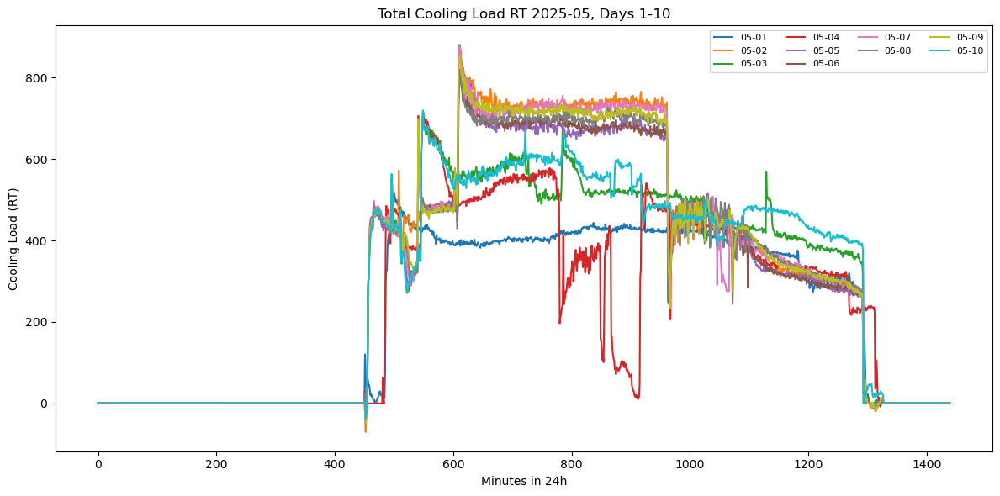

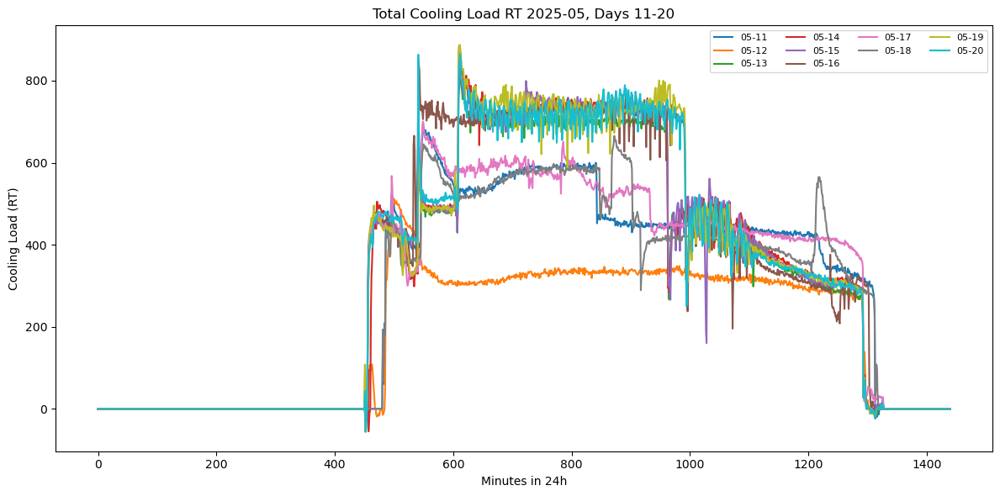

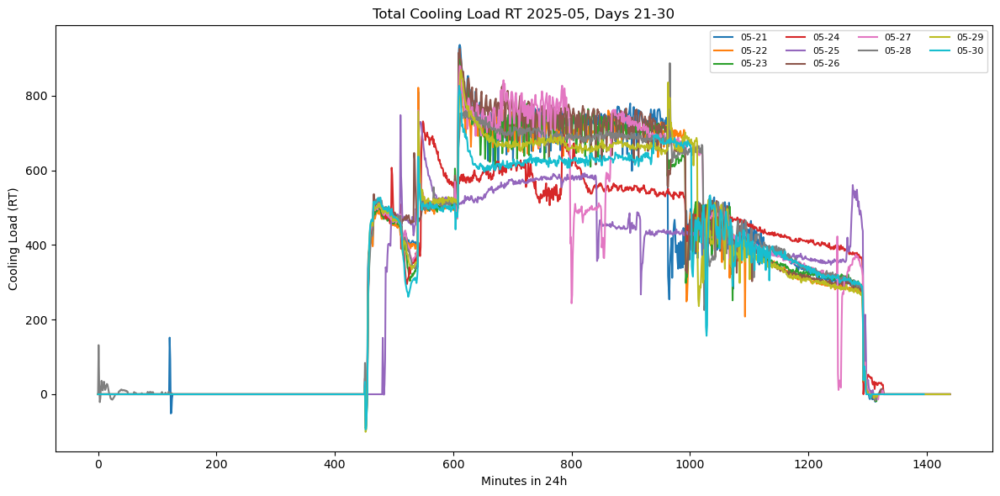

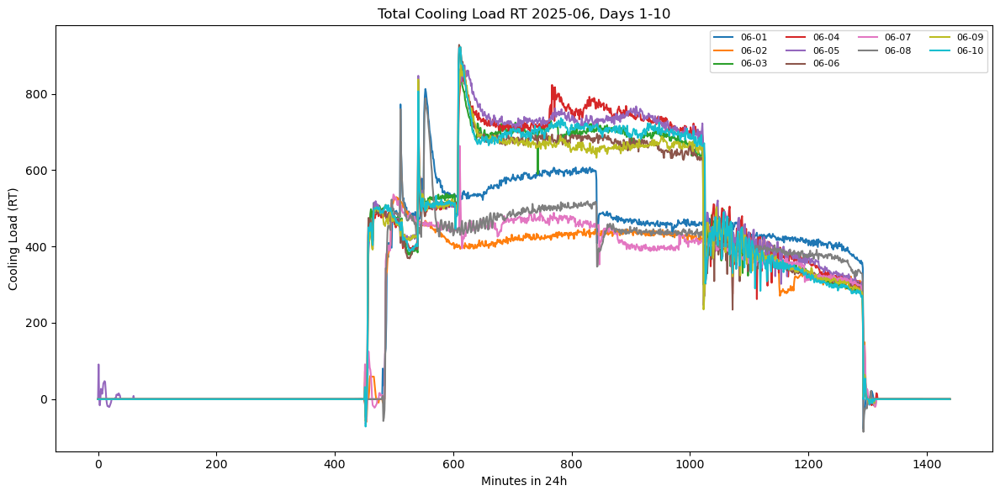

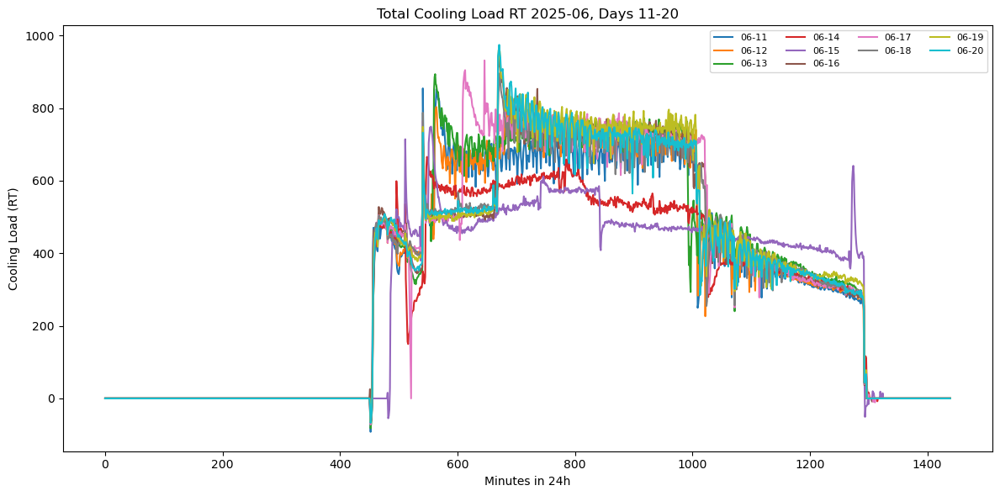

...

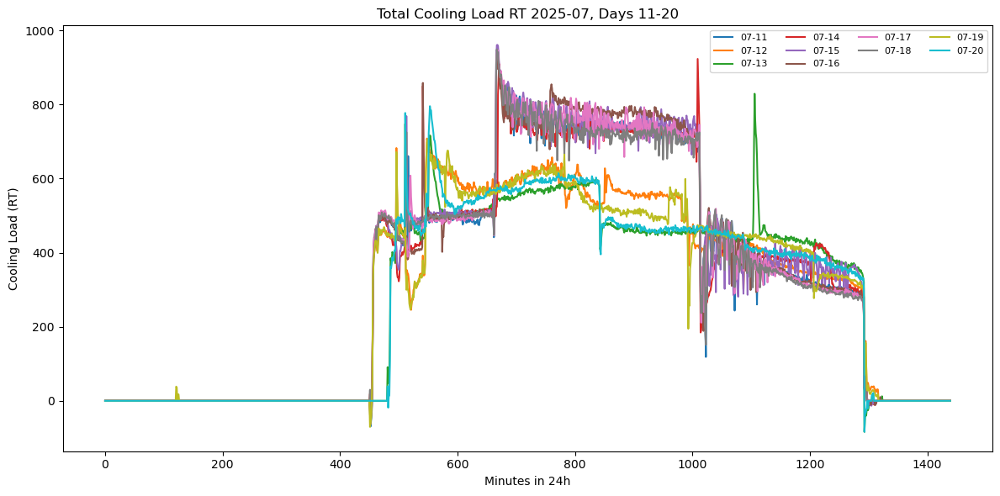

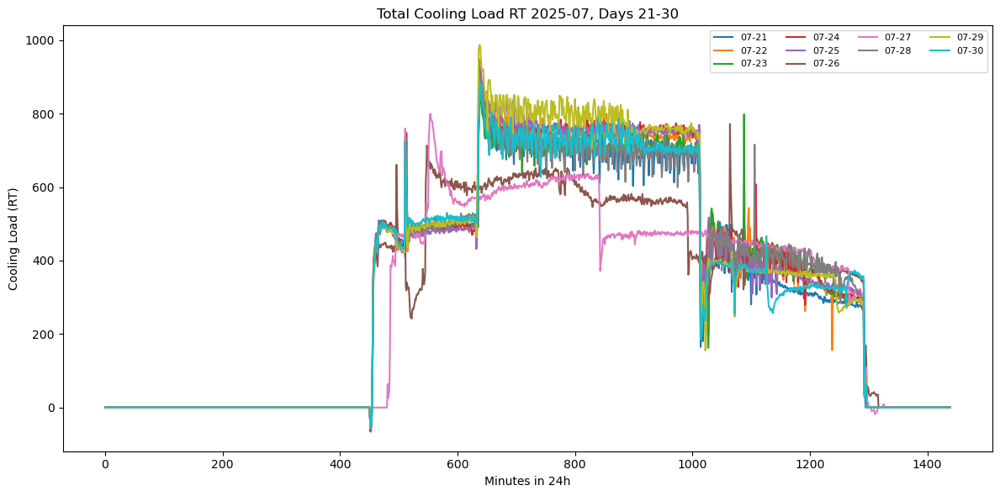

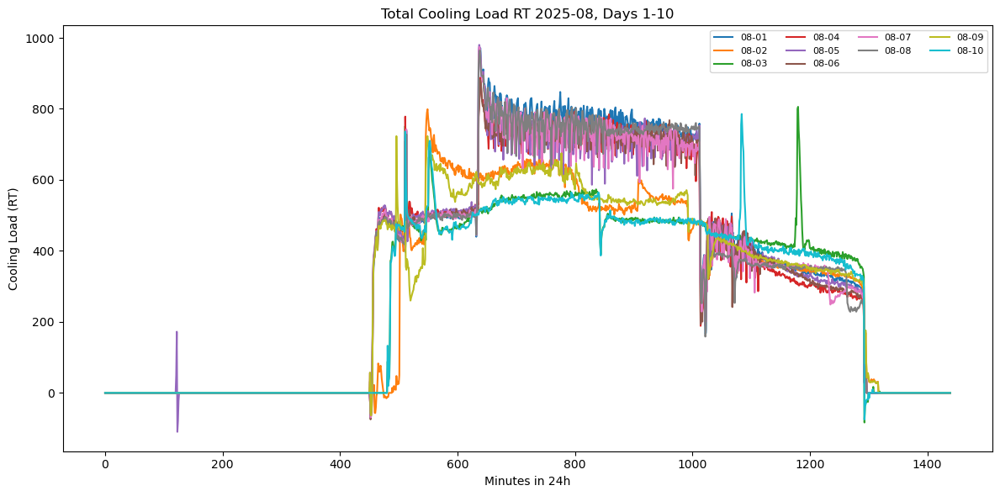

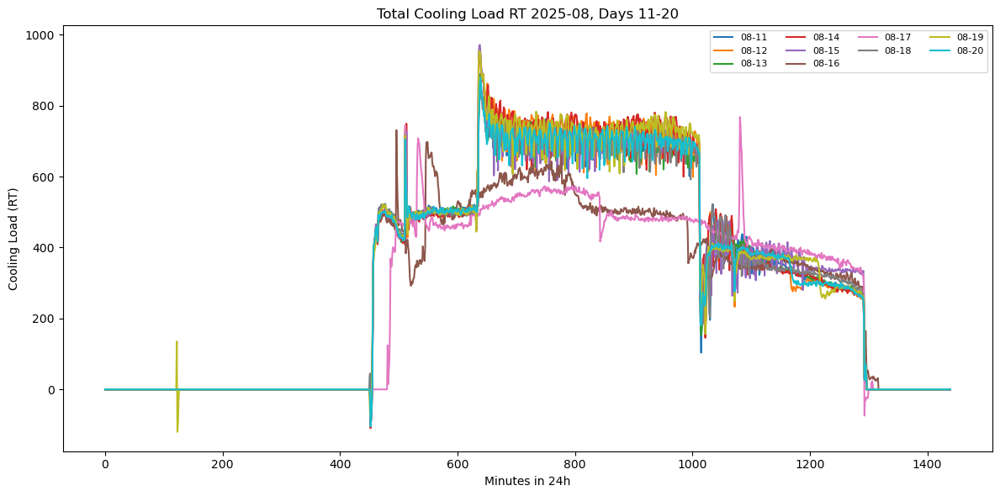

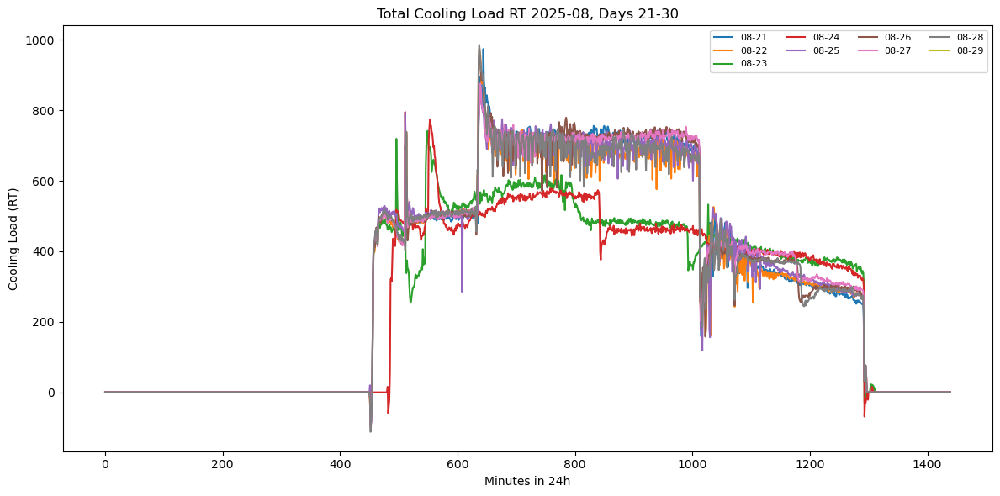

In [180]:
plot_cooling_chunks(df["TOTAL_COOLING_RT_ML_BS"], year=2025, month=5, save_path=r"C:\Users\QiYangWong\Downloads\Amcorp Pic")
plot_cooling_chunks(df["TOTAL_COOLING_RT_ML_BS"], year=2025, month=6, save_path=r"C:\Users\QiYangWong\Downloads\Amcorp Pic")
plot_cooling_chunks(df["TOTAL_COOLING_RT_ML_BS"], year=2025, month=7, save_path=r"C:\Users\QiYangWong\Downloads\Amcorp Pic")
plot_cooling_chunks(df["TOTAL_COOLING_RT_ML_BS"], year=2025, month=8, save_path=r"C:\Users\QiYangWong\Downloads\Amcorp Pic")


In [181]:
def plot_cooling_range(series, start_date, end_date, label="Custom Range", save_path=None, show_in_notebook=True):
    sub = series[(series.index.date >= pd.to_datetime(start_date).date()) &
                 (series.index.date <= pd.to_datetime(end_date).date())]
    if sub.empty:
        print(f"No data found for {label}")
        return

    fig, ax = plt.subplots(figsize=(12,6))
    for d, g in sub.groupby(sub.index.date):
        ax.plot(g.index.hour * 60 + g.index.minute, g, label=str(d)[-5:])

    ax.set_title(f"Cooling Load RT ({label}) {start_date} → {end_date}")
    ax.set_xlabel("Minutes in 24h")
    ax.set_ylabel("Cooling Load (RT)")
    ax.legend(ncol=4, fontsize=8)
    fig.tight_layout()

    if save_path:
        os.makedirs(save_path, exist_ok=True)
        filename = os.path.join(save_path, f"Cooling_{label}_{start_date}_{end_date}.png")

        fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor='white')
        print(f"Saved successfully to: {filename}")

    if show_in_notebook:
        plt.show()
    else:
        plt.close(fig)


Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekdays_2025-05-01_2025-05-31.png


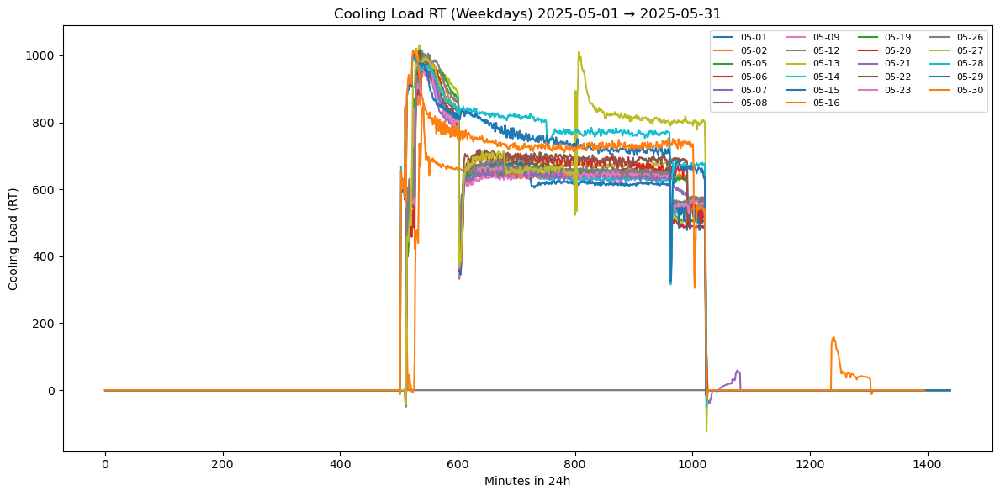

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekends_2025-05-01_2025-05-31.png


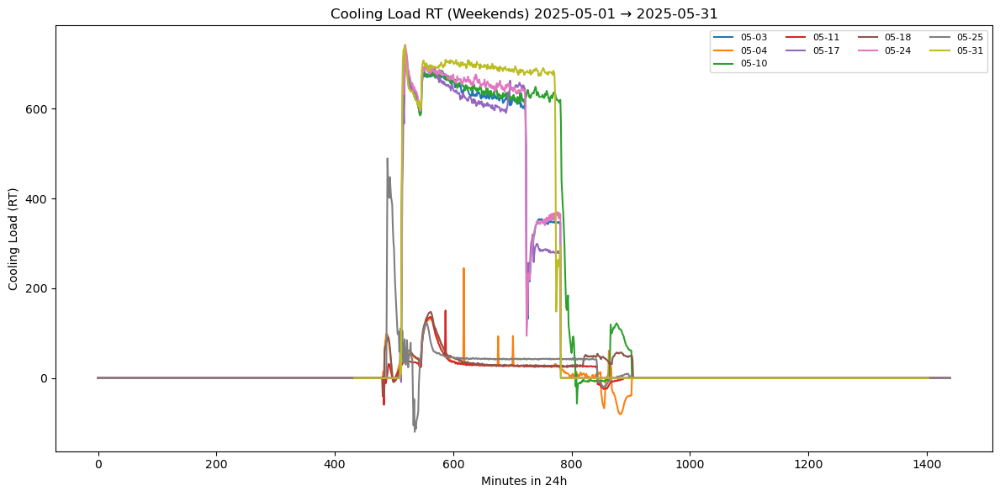

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekdays_2025-06-01_2025-06-30.png


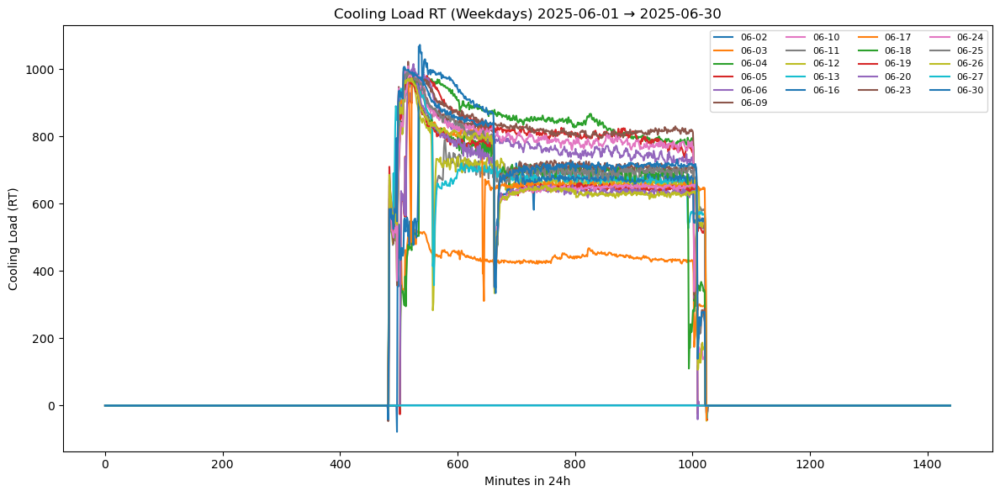

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekends_2025-06-01_2025-06-30.png


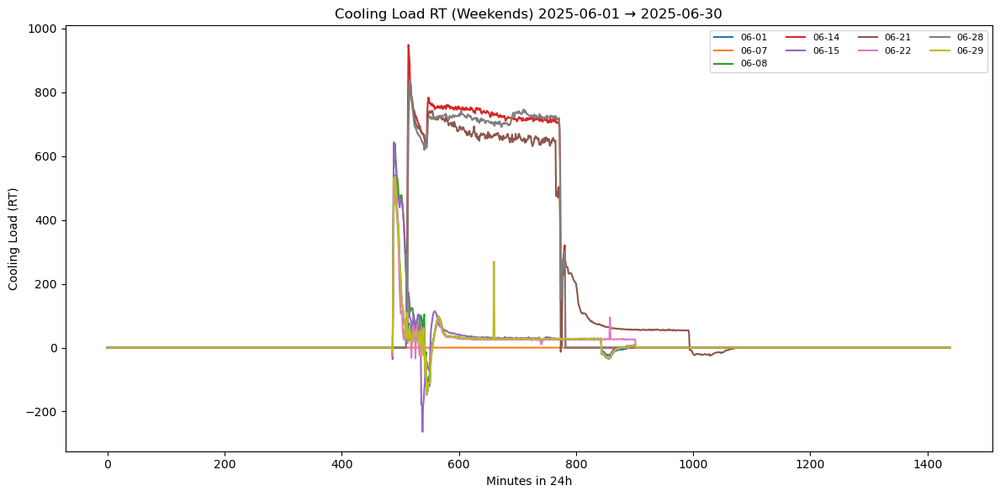

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekdays_2025-07-01_2025-07-31.png


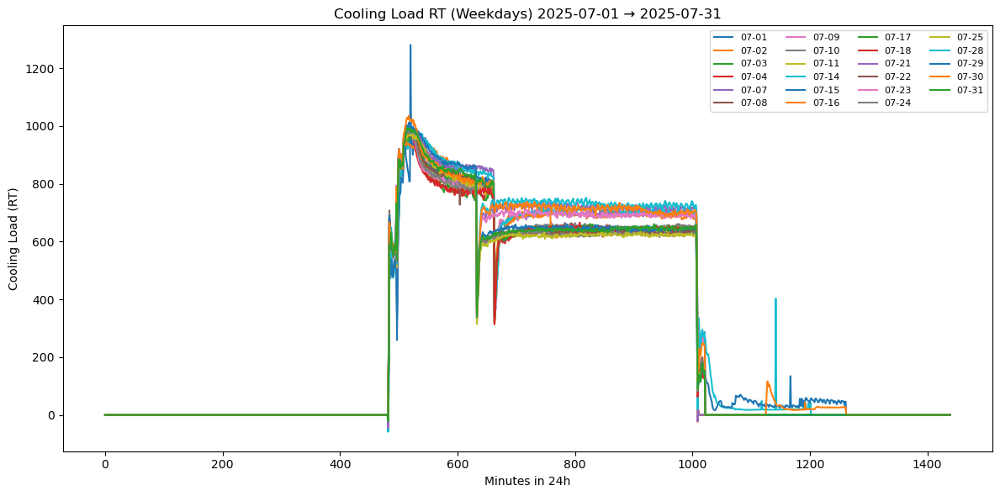

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekends_2025-07-01_2025-07-31.png


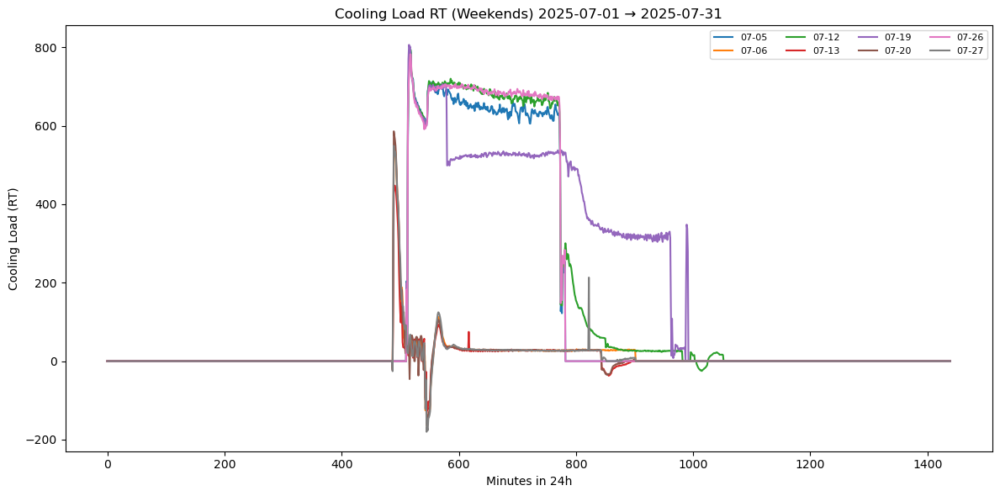

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekdays_2025-08-01_2025-08-31.png


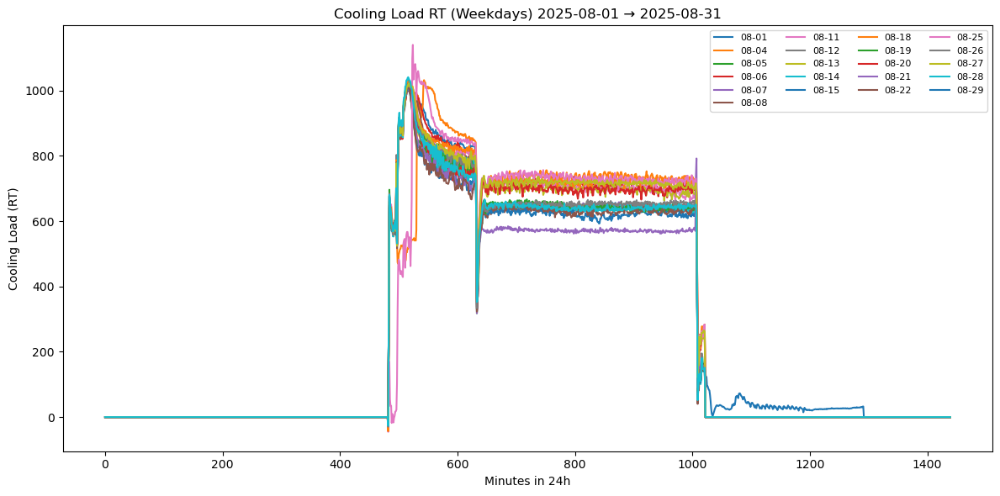

Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekends_2025-08-01_2025-08-31.png


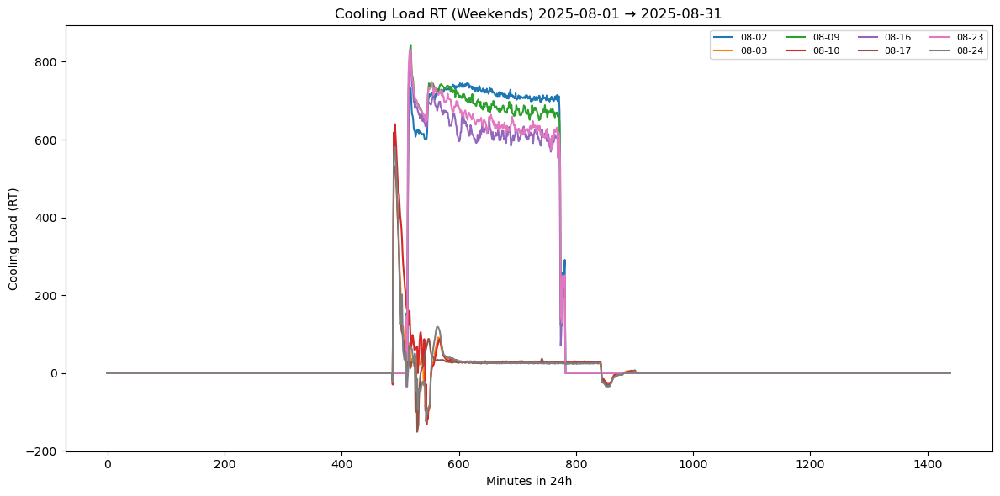

In [182]:
save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

weekdays = df[df.index.to_series().dt.dayofweek < 5]
plot_cooling_range(
    weekdays["TOTAL_COOLING_RT_TA_TB"],
    "2025-05-01",
    "2025-05-31",
    label="Weekdays",
    save_path=save_folder
)
weekends = df[df.index.to_series().dt.dayofweek >= 5]
plot_cooling_range(
    weekends["TOTAL_COOLING_RT_TA_TB"],
    "2025-05-01",
    "2025-05-31",
    label="Weekends",
    save_path=save_folder
)

weekdays = df[df.index.to_series().dt.dayofweek < 5]
plot_cooling_range(
    weekdays["TOTAL_COOLING_RT_TA_TB"],
    "2025-06-01",
    "2025-06-30",
    label="Weekdays",
    save_path=save_folder
)
weekends = df[df.index.to_series().dt.dayofweek >= 5]
plot_cooling_range(
    weekends["TOTAL_COOLING_RT_TA_TB"],
    "2025-06-01",
    "2025-06-30",
    label="Weekends",
    save_path=save_folder
)


weekdays = df[df.index.to_series().dt.dayofweek < 5]
plot_cooling_range(
    weekdays["TOTAL_COOLING_RT_TA_TB"],
    "2025-07-01",
    "2025-07-31",
    label="Weekdays",
    save_path=save_folder
)
weekends = df[df.index.to_series().dt.dayofweek >= 5]
plot_cooling_range(
    weekends["TOTAL_COOLING_RT_TA_TB"],
    "2025-07-01",
    "2025-07-31",
    label="Weekends",
    save_path=save_folder
)


weekdays = df[df.index.to_series().dt.dayofweek < 5]
plot_cooling_range(
    weekdays["TOTAL_COOLING_RT_TA_TB"],
    "2025-08-01",
    "2025-08-31",
    label="Weekdays",
    save_path=save_folder
)
weekends = df[df.index.to_series().dt.dayofweek >= 5]
plot_cooling_range(
    weekends["TOTAL_COOLING_RT_TA_TB"],
    "2025-08-01",
    "2025-08-31",
    label="Weekends",
    save_path=save_folder
)


In [183]:
def plot_weekday_vs_weekend(series, year=2025, month=8, save_path=None, show_in_notebook=True):
    s = series[(series.index.year == year) & (series.index.month == month)]
    if s.empty:
        print("No data found for this month.")
        return
    
    df_tmp = pd.DataFrame({"value": s})
    df_tmp["minute"] = df_tmp.index.hour * 60 + df_tmp.index.minute
    df_tmp["weekday"] = df_tmp.index.weekday

    weekday_avg = df_tmp[df_tmp["weekday"] < 5].groupby("minute")["value"].mean()
    weekend_avg = df_tmp[df_tmp["weekday"] >= 5].groupby("minute")["value"].mean()

    print(f"\n=== {year}-{month:02d} Cooling Load Summary ===")
    print(f"Weekday RT avg: {weekday_avg.mean():.2f}   |   Weekend RT avg: {weekend_avg.mean():.2f}")

    fig, ax = plt.subplots(figsize=(12,6))
    ax.plot(weekday_avg.index, weekday_avg.values, label="Weekday Avg", linewidth=2)
    ax.plot(weekend_avg.index, weekend_avg.values, label="Weekend Avg", linewidth=2, linestyle="--")
    ax.set_title(f"Cooling Load Profile RT (Weekday vs Weekend) - {year}-{month:02d}")
    ax.set_xlabel("Minutes in 24h")
    ax.set_ylabel("Cooling Load (RT)")
    ax.legend()
    fig.tight_layout()

    if save_path:
        os.makedirs(save_path, exist_ok=True)
        filename = os.path.join(save_path, f"Cooling_Weekday_vs_Weekend_{year}-{month:02d}.png")
        fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"✅ Saved successfully: {filename}")




=== 2025-08 Cooling Load Summary ===
Weekday RT avg: 318.08   |   Weekend RT avg: 270.81
✅ Saved successfully: C:\Users\QiYangWong\Downloads\Amcorp Pic\Cooling_Weekday_vs_Weekend_2025-08.png


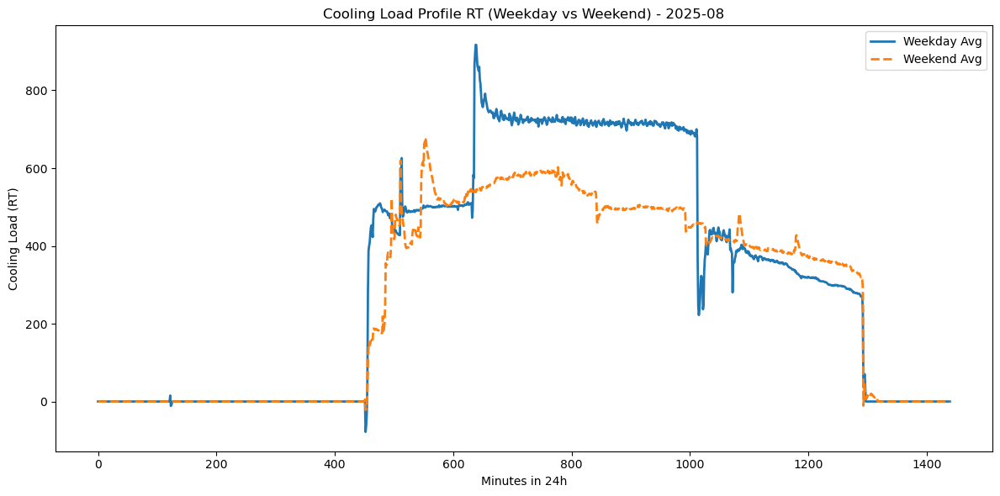

In [185]:
save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

plot_weekday_vs_weekend(
    df["TOTAL_COOLING_RT_ML_BS"],
    year=2025,
    month=8,
    save_path=save_folder
)



=== Main Incoming Energy (kWh) ===
                 min         mean         max
PMINC1_E  20605518.7  21023401.91  21444329.7
PMINC2_E   8352730.6   8493707.38   8639620.3


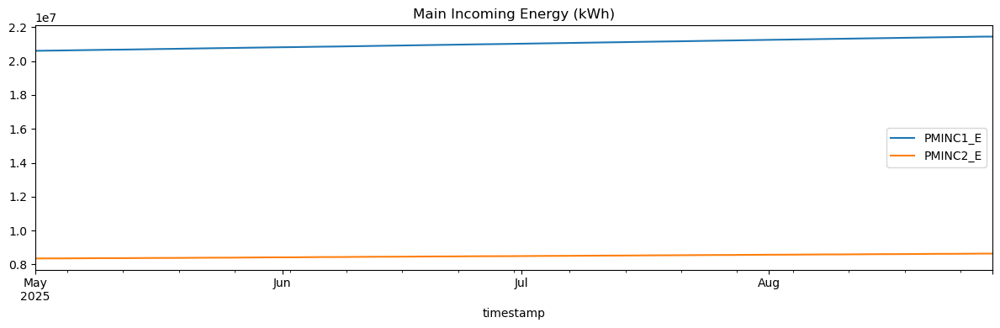


=== Main Incoming Amps (A) ===
            min   mean    max
PMINC1_A_R  4.5  10.57   37.5
PMINC1_A_Y  0.0  10.42   41.0
PMINC1_A_B  0.0  10.62   41.0
PMINC2_A_R  0.0  27.62  143.0
PMINC2_A_Y  0.0  27.31  144.5
PMINC2_A_B  0.0  23.56  142.0


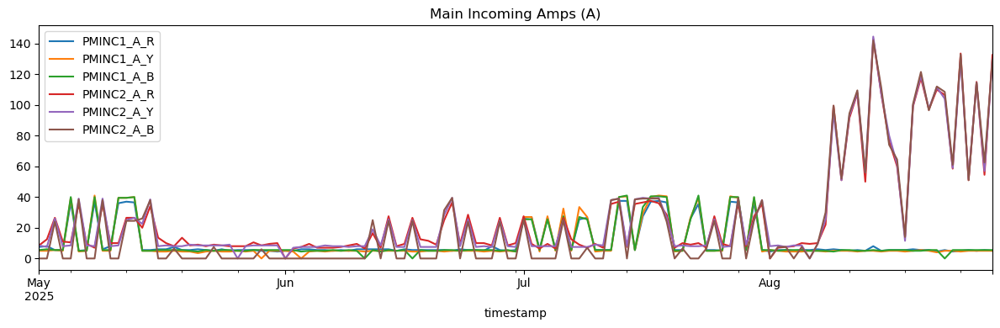


=== Main Incoming Power & Max Demand (kW) ===
               min    mean     max
PMINC1_PWR    0.00    0.75    1.70
PMINC1_MD   362.15  766.07  791.35
PMINC2_PWR    0.00    1.20    3.05
PMINC2_MD     6.80  575.24  585.70


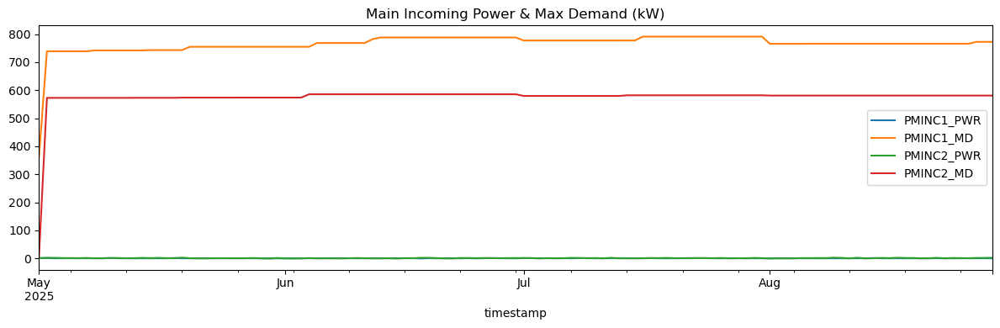

In [186]:
plot_and_stats_multi(main_incoming_energy, "Main Incoming Energy (kWh)", kind="last")
plot_and_stats_multi(main_incoming_amps, "Main Incoming Amps (A)", kind="mean")
plot_and_stats_multi(main_incoming_kw, "Main Incoming Power & Max Demand (kW)", kind="mean")



=== Submeters Cooling Energy (kWh) ===
                   min         mean         max
EMML_MOD_E  72529066.0  74057328.78  75584315.0
EMBS_MOD_E  11236882.0  11236882.00  11236882.0
EMTA_MOD_E         0.0  21618056.55  22620703.0
EMTB_MOD_E  17493739.0  18015917.25  18571694.0


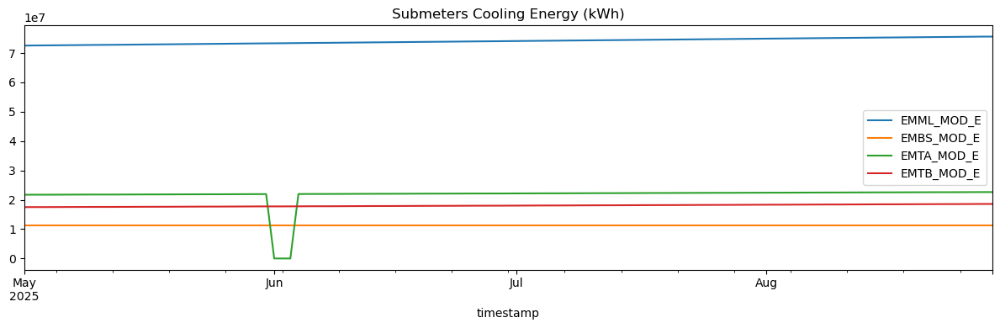

In [187]:
plot_and_stats_multi(tenant_energy, "Submeters Cooling Energy (kWh)", kind="last")


=== Secondary CHWP Daily Energy (kWh) ===
                 min      mean       max
SCHWP1_MOD_PWR  0.05  24395.14  27583.59
SCHWP2_MOD_PWR  0.05   6055.76  19253.70
SCHWP3_MOD_PWR  0.05   7780.89  22433.55


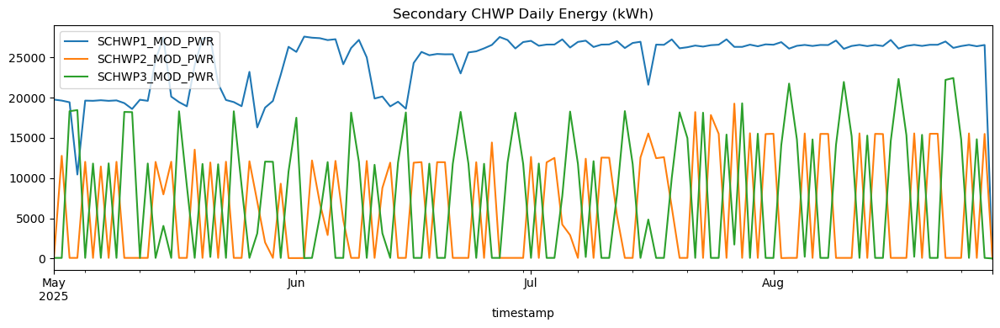


=== Primary CHWP Daily Energy (kWh) ===
                 min     mean       max
PCHWP4_MOD_PWR  0.05  5615.21  10989.74
PCHWP5_MOD_PWR  0.05  2224.23  10810.41


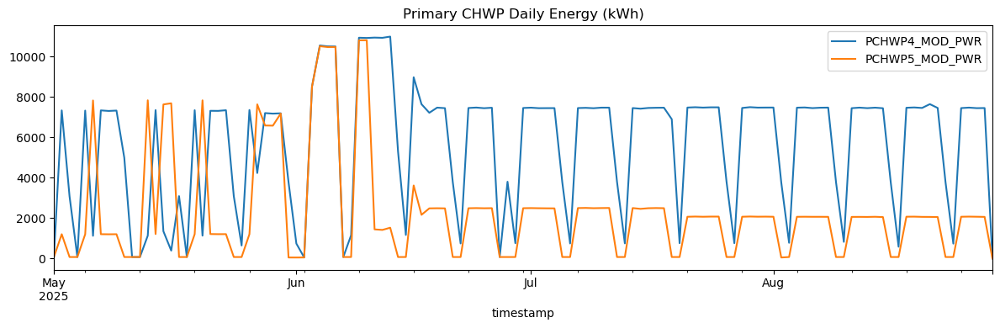

In [188]:
plot_and_stats_multi(schwp_kw, "Secondary CHWP Daily Energy (kWh)", kind="sum")
plot_and_stats_multi(pchwp_kw, "Primary CHWP Daily Energy (kWh)", kind="sum")


=== Distribution Pump Daily Energy (kWh) ===
              min     mean      max
DP1_MOD_PWR  0.06  2187.78  6093.07
DP2_MOD_PWR  0.06  1597.14  6051.84


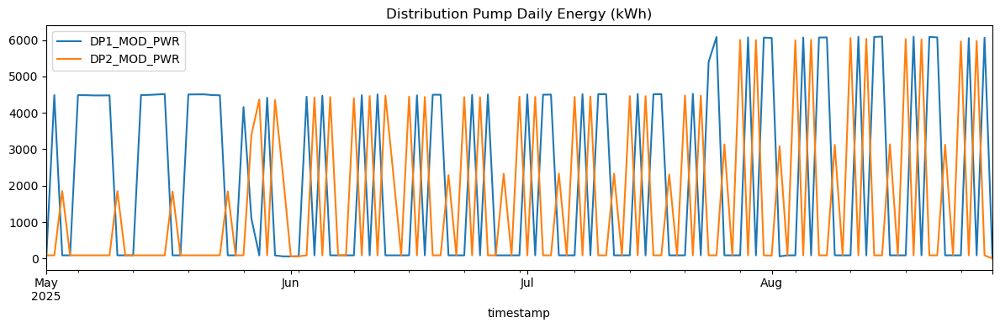


=== Heat Exchanger Pump Daily Energy (kWh) ===
                min     mean      max
HEXP1_MOD_PWR  0.08  2532.47  6208.64
HEXP2_MOD_PWR  0.05  1903.61  9670.78


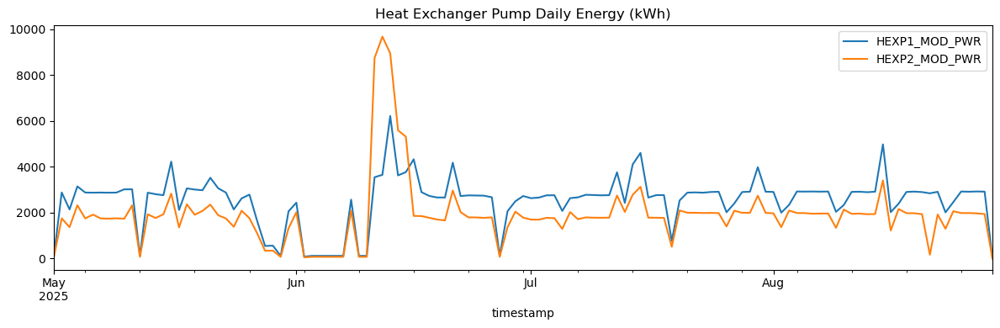

In [189]:
plot_and_stats_multi(dp_kw, "Distribution Pump Daily Energy (kWh)", kind="sum")
plot_and_stats_multi(hexp_kw, "Heat Exchanger Pump Daily Energy (kWh)", kind="sum")



=== CH5 2025-05 (all) ===
      TE1CH5_ENG  TE2CH5_ENG
min         6.10       12.00
mean       13.96       16.14
max        21.50       23.30
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-05_Days1-10.png


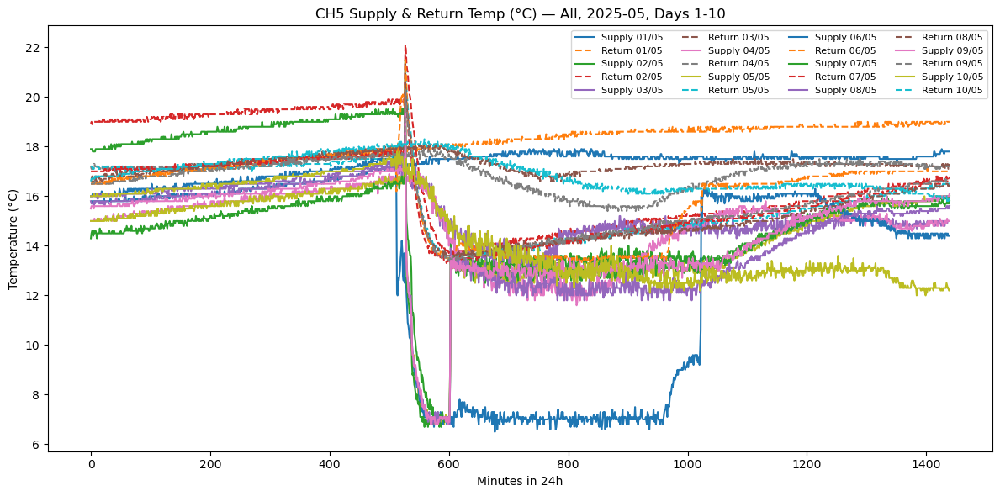

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-05_Days11-20.png


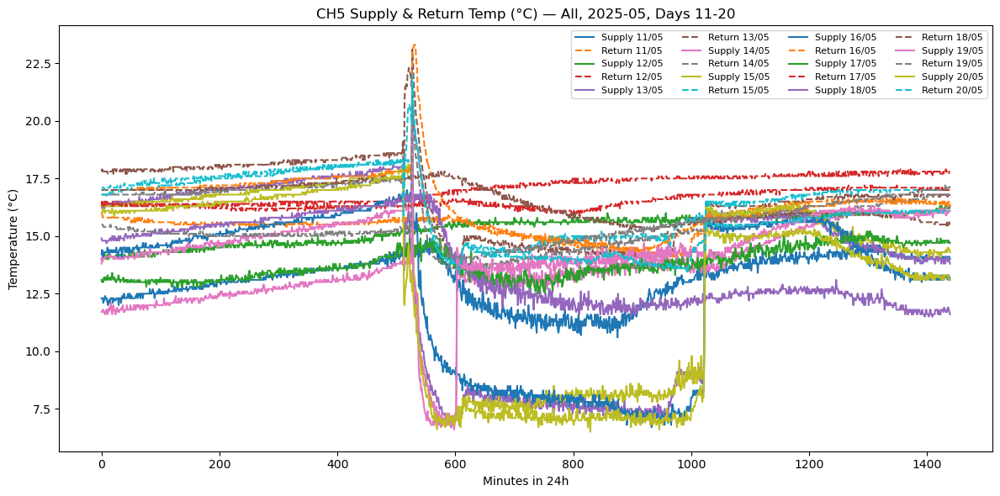

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-05_Days21-30.png


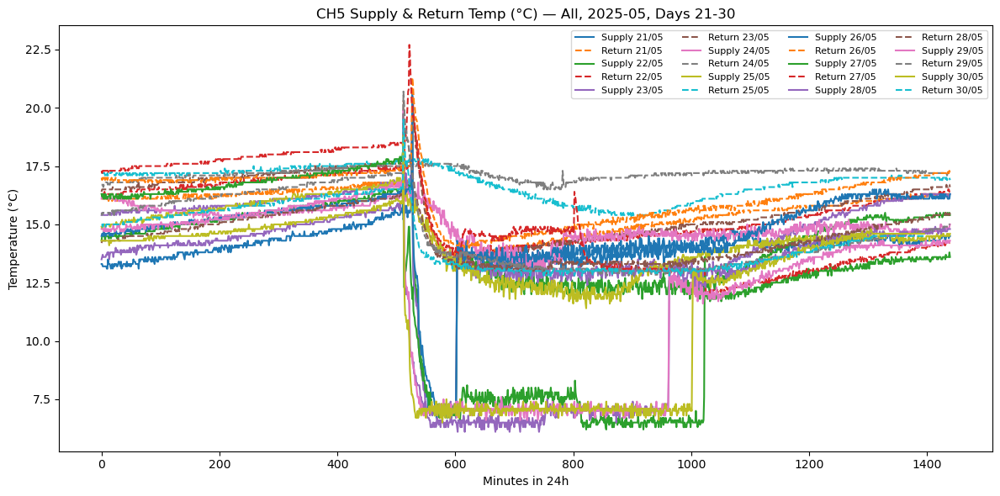


=== CH5 2025-05 (weekdays) ===
      TE1CH5_ENG  TE2CH5_ENG
min         6.10        12.0
mean       13.82        15.9
max        21.50        23.3
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekdays_2025-05.png


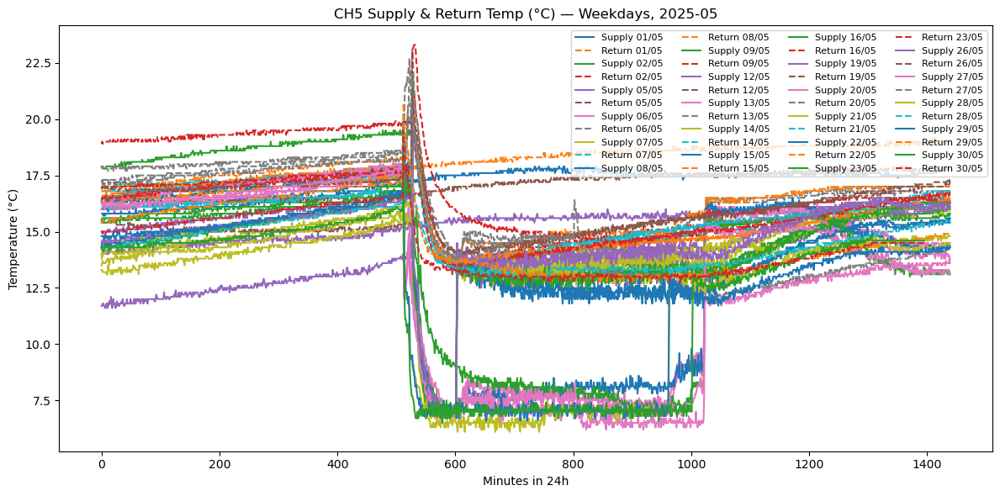


=== CH5 2025-05 (weekends) ===
      TE1CH5_ENG  TE2CH5_ENG
min        10.60       14.30
mean       14.32       16.73
max        17.80       18.30
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekends_2025-05.png


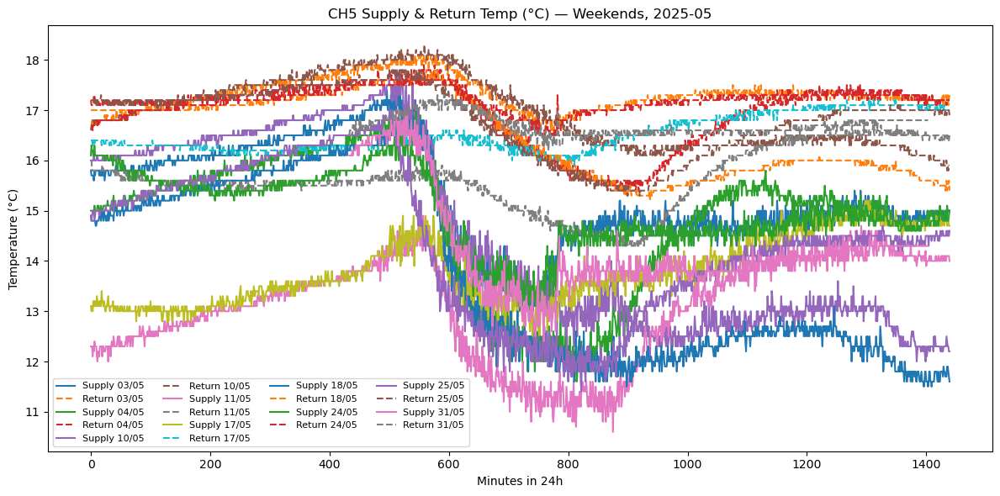


=== CH5 2025-06 (all) ===
      TE1CH5_ENG  TE2CH5_ENG
min          5.3        11.5
mean        13.6        15.4
max         23.8        24.7
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-06_Days1-10.png


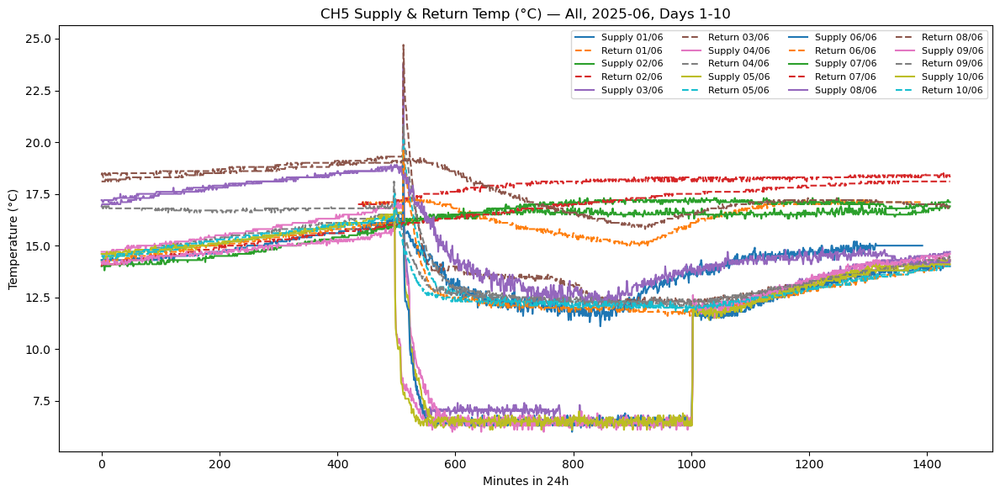

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-06_Days11-20.png


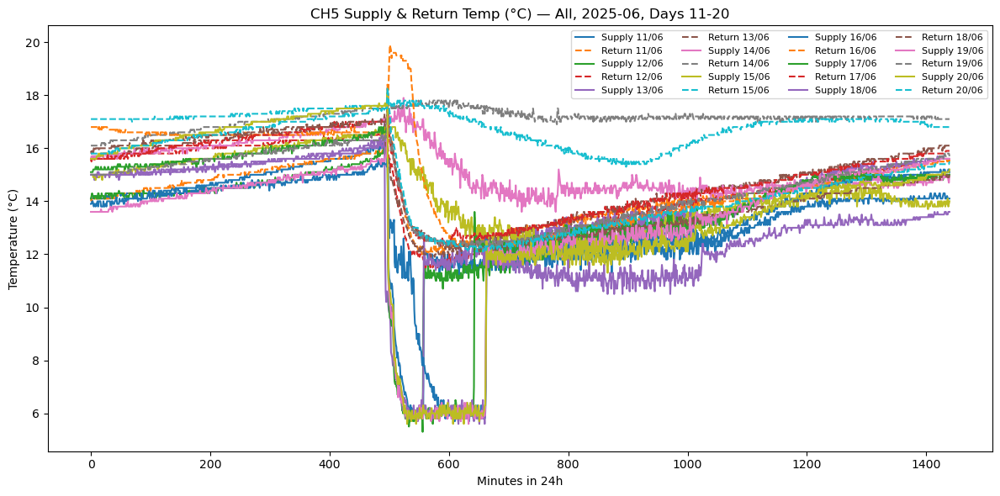

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-06_Days21-30.png


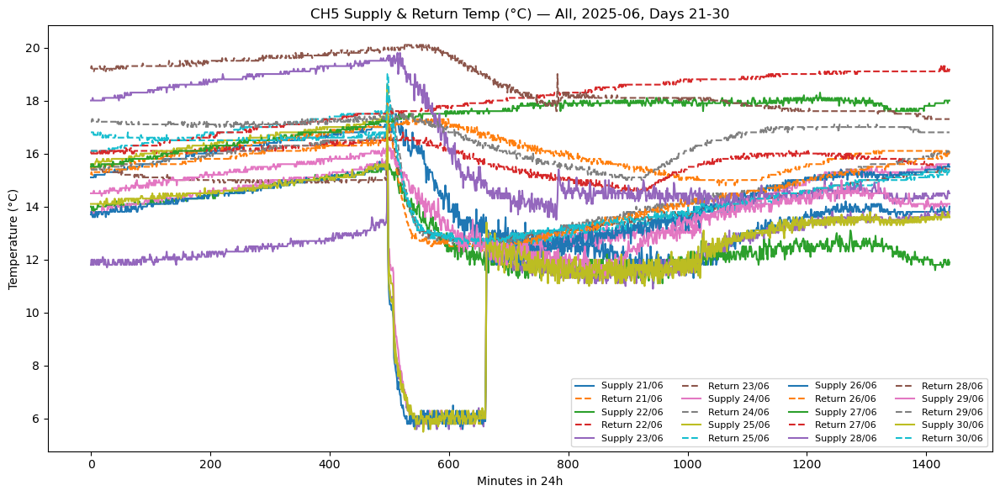


=== CH5 2025-06 (weekdays) ===
      TE1CH5_ENG  TE2CH5_ENG
min         5.30       11.50
mean       13.11       14.78
max        23.80       24.70
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekdays_2025-06.png


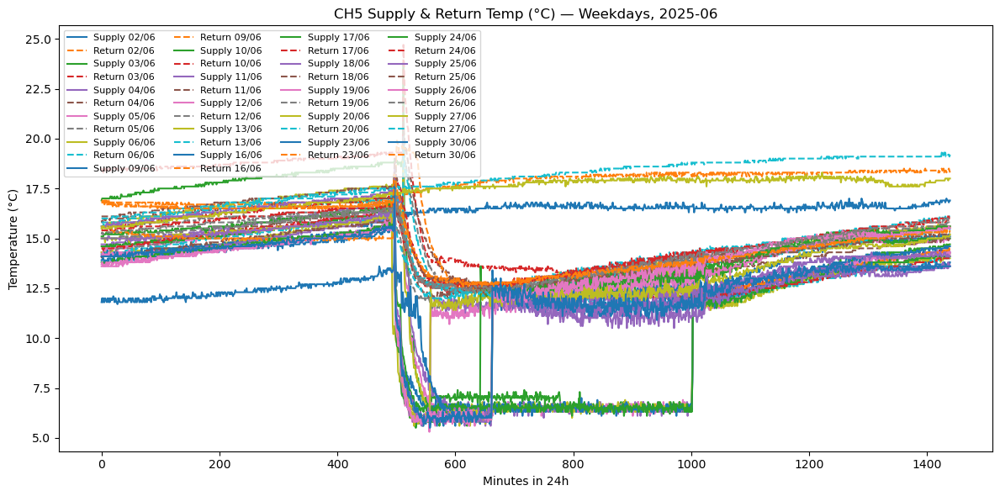


=== CH5 2025-06 (weekends) ===
      TE1CH5_ENG  TE2CH5_ENG
min        11.10       14.00
mean       14.78       16.89
max        19.80       20.10
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekends_2025-06.png


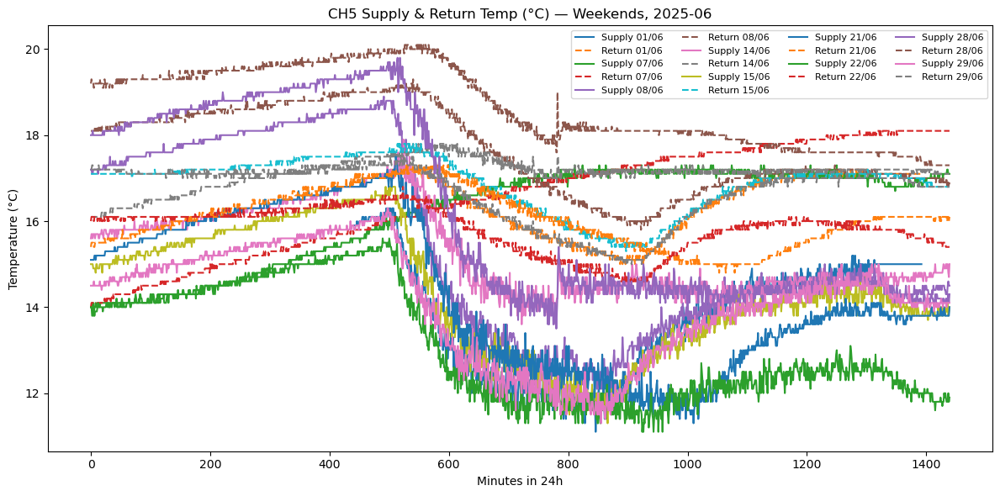


=== CH5 2025-07 (all) ===
      TE1CH5_ENG  TE2CH5_ENG
min         5.50       12.10
mean       13.33       15.15
max        18.60       19.60
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-07_Days1-10.png


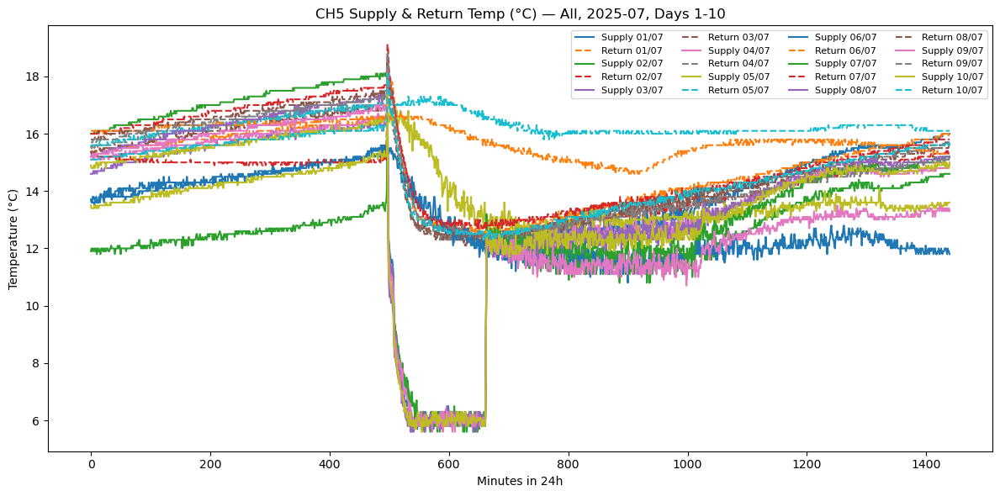

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-07_Days11-20.png


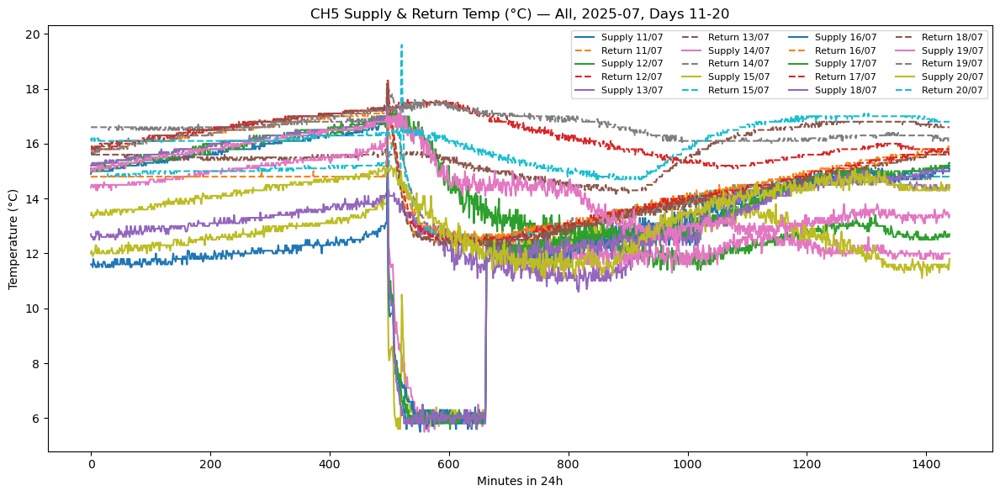

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-07_Days21-30.png


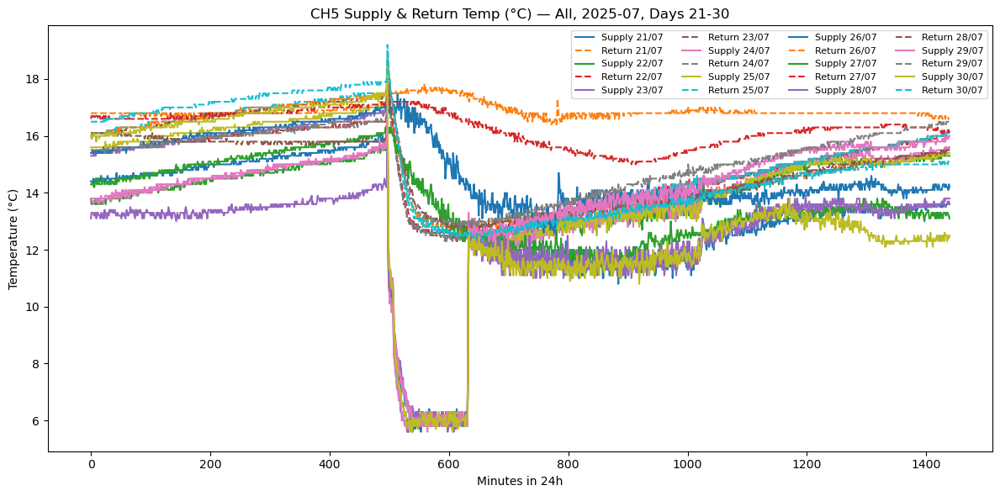


=== CH5 2025-07 (weekdays) ===
      TE1CH5_ENG  TE2CH5_ENG
min         5.50       12.10
mean       13.13       14.77
max        18.60       19.60
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekdays_2025-07.png


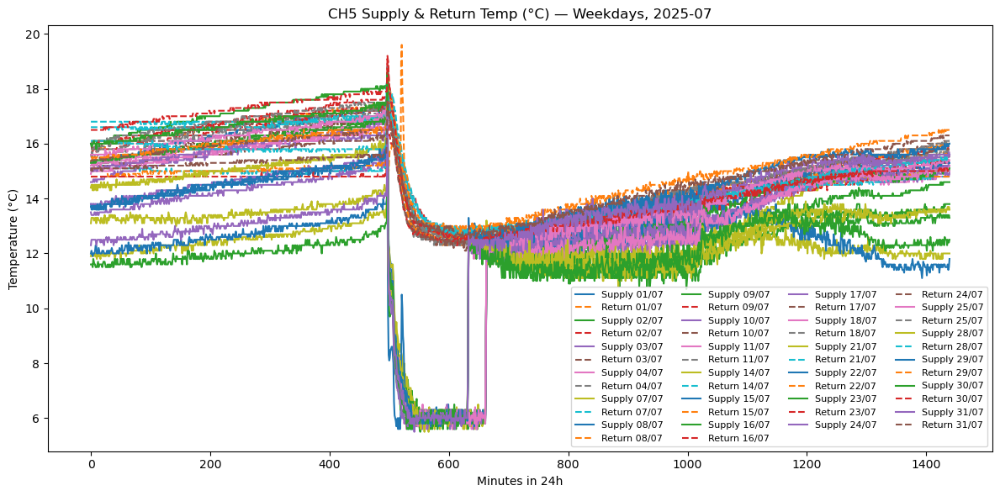


=== CH5 2025-07 (weekends) ===
      TE1CH5_ENG  TE2CH5_ENG
min         10.6       14.10
mean        13.9       16.23
max         17.5       17.80
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekends_2025-07.png


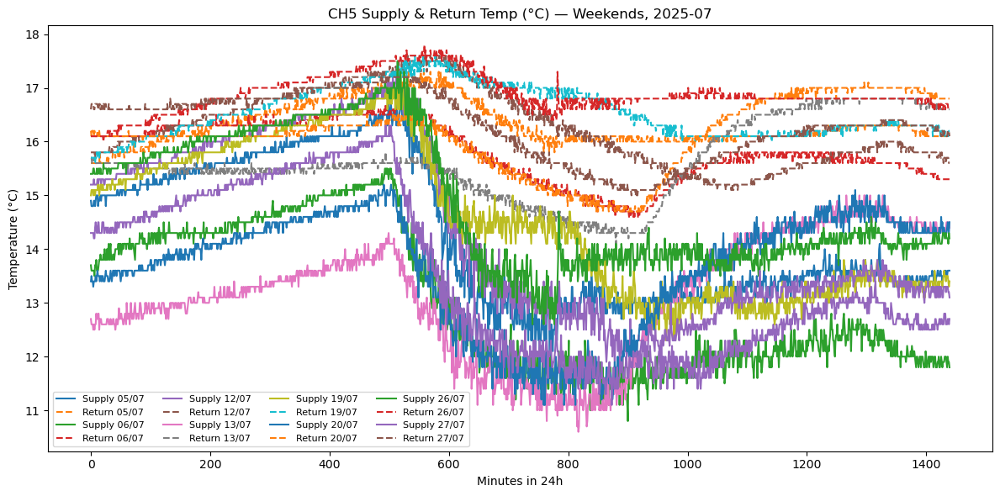


=== CH5 2025-08 (all) ===
      TE1CH5_ENG  TE2CH5_ENG
min         5.50       11.60
mean       13.12       14.95
max        19.20       20.80
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-08_Days1-10.png


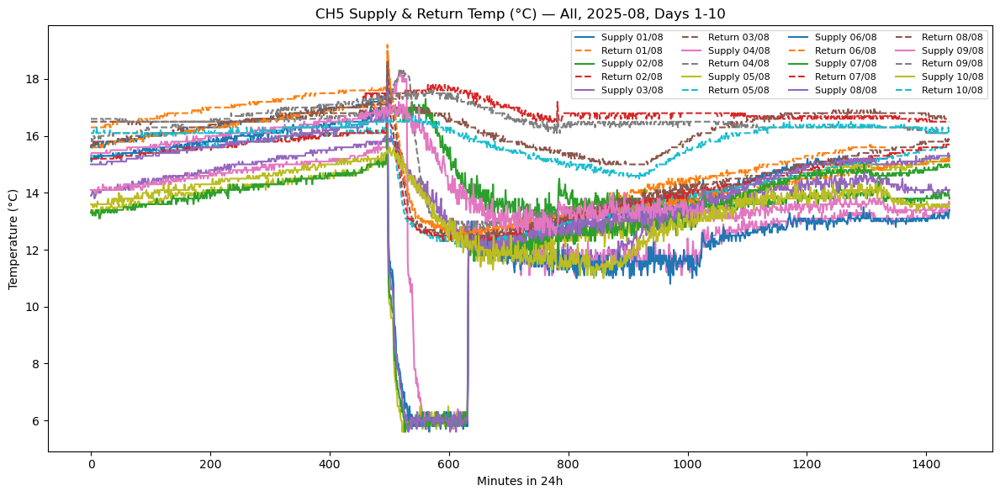

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-08_Days11-20.png


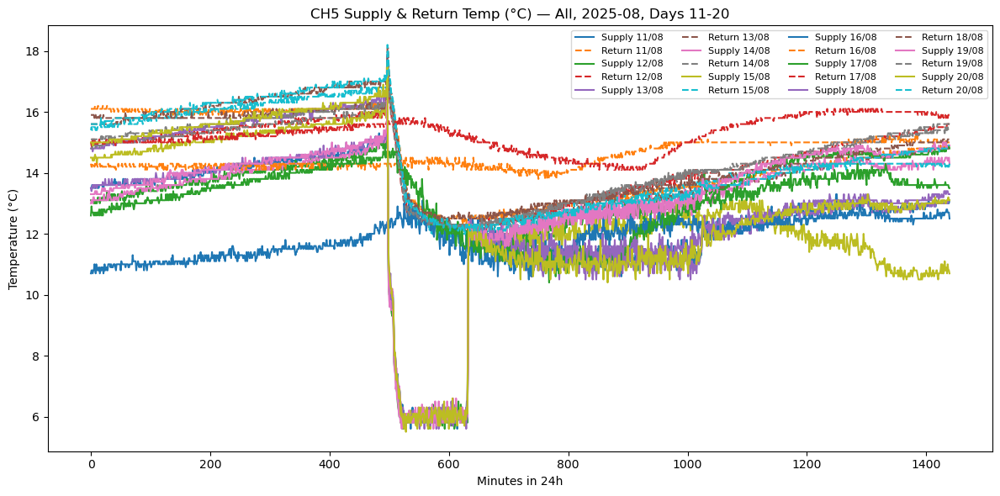

Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_all_2025-08_Days21-30.png


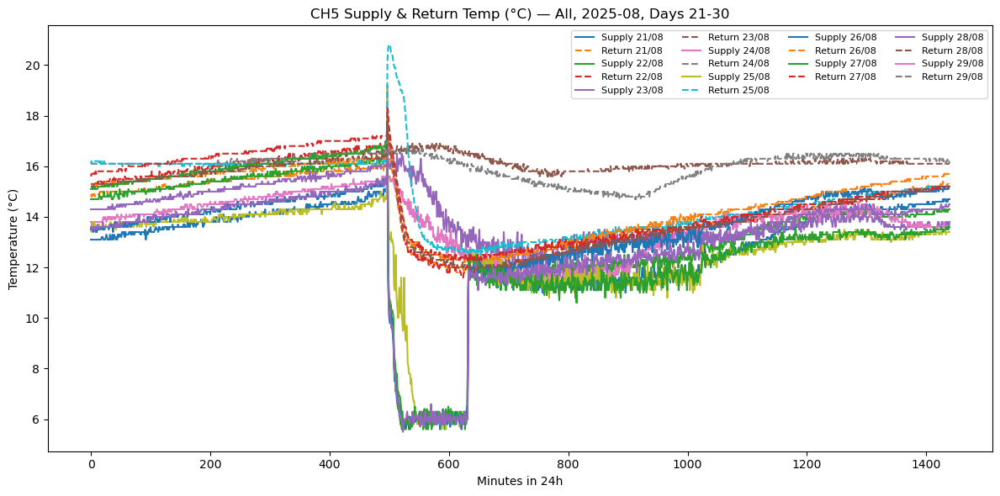


=== CH5 2025-08 (weekdays) ===
      TE1CH5_ENG  TE2CH5_ENG
min         5.50       11.60
mean       12.95       14.57
max        19.20       20.80
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekdays_2025-08.png


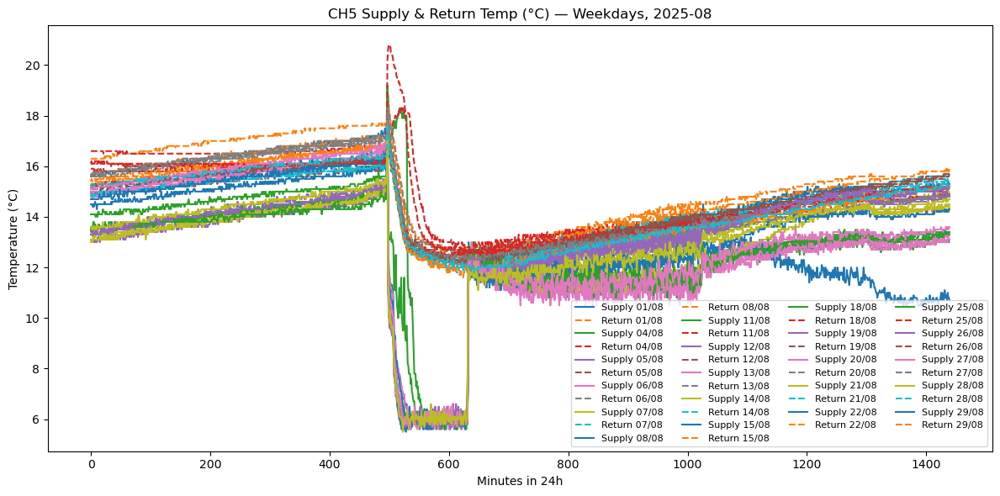


=== CH5 2025-08 (weekends) ===
      TE1CH5_ENG  TE2CH5_ENG
min        10.40       13.80
mean       13.58       15.91
max        17.30       17.80
Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_Supply_Return_weekends_2025-08.png


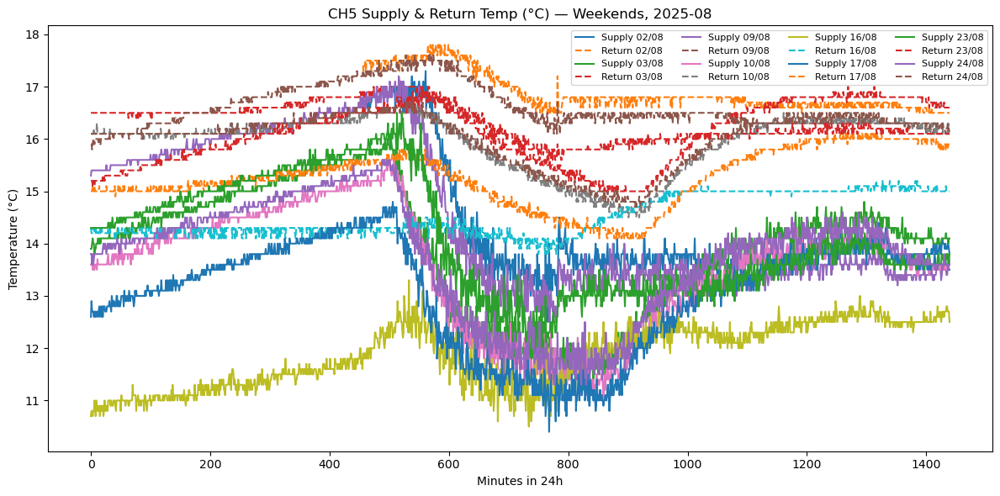

In [190]:
def plot_chiller_supply_return(df, chiller=1, year=2025, month=6, mode="all", save_path=None, show_in_notebook=True):
    supply_col = f"TE1CH{chiller}_ENG"
    return_col = f"TE2CH{chiller}_ENG"

    if supply_col not in df.columns or return_col not in df.columns:
        print(f" Columns for CH{chiller} not found.")
        return

    sub = df[(df.index.year == year) & (df.index.month == month)]

    if mode == "weekdays":
        sub = sub[sub.index.weekday < 5]
    elif mode == "weekends":
        sub = sub[sub.index.weekday >= 5]

    if sub.empty:
        print(f"No data found for CH{chiller} ({mode}) {year}-{month:02d}")
        return

    stats = sub[[supply_col, return_col]].describe().loc[["min","mean","max"]].round(2)
    print(f"\n=== CH{chiller} {year}-{month:02d} ({mode}) ===")
    print(stats)

    if mode == "all":
        _, last = calendar.monthrange(year, month)
        for start in (1, 11, 21):
            end = min(start + 9, last)
            sub_chunk = sub[(sub.index.day >= start) & (sub.index.day <= end)]
            if sub_chunk.empty:
                continue

            fig, ax = plt.subplots(figsize=(12,6))
            for d, g in sub_chunk.groupby(sub_chunk.index.date):
                ax.plot(g.index.hour*60 + g.index.minute, g[supply_col], label=f"Supply {d:%d/%m}")
                ax.plot(g.index.hour*60 + g.index.minute, g[return_col], linestyle="--", label=f"Return {d:%d/%m}")

            ax.set_title(f"CH{chiller} Supply & Return Temp (°C) — All, {year}-{month:02d}, Days {start}-{end}")
            ax.set_xlabel("Minutes in 24h")
            ax.set_ylabel("Temperature (°C)")
            ax.legend(ncol=4, fontsize=8)
            fig.tight_layout()

            if save_path:
                os.makedirs(save_path, exist_ok=True)
                filename = os.path.join(save_path, f"CH{chiller}_all_{year}-{month:02d}_Days{start}-{end}.png")
                fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
                print(f"Saved: {filename}")

            if show_in_notebook:
                plt.show()
            else:
                plt.close(fig)

    else:
        fig, ax = plt.subplots(figsize=(12,6))
        for d, g in sub.groupby(sub.index.date):
            ax.plot(g.index.hour*60 + g.index.minute, g[supply_col], label=f"Supply {d:%d/%m}")
            ax.plot(g.index.hour*60 + g.index.minute, g[return_col], linestyle="--", label=f"Return {d:%d/%m}")

        ax.set_title(f"CH{chiller} Supply & Return Temp (°C) — {mode.title()}, {year}-{month:02d}")
        ax.set_xlabel("Minutes in 24h")
        ax.set_ylabel("Temperature (°C)")
        ax.legend(ncol=4, fontsize=8)
        fig.tight_layout()

        if save_path:
            os.makedirs(save_path, exist_ok=True)
            filename = os.path.join(save_path, f"CH{chiller}_Supply_Return_{mode}_{year}-{month:02d}.png")
            fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
            print(f"Saved: {filename}")

        if show_in_notebook:
            plt.show()
        else:
            plt.close(fig)


save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

plot_chiller_supply_return(df, chiller=5, year=2025, month=5, mode="all", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=5, mode="weekdays", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=5, mode="weekends", save_path=save_folder)

plot_chiller_supply_return(df, chiller=5, year=2025, month=6, mode="all", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=6, mode="weekdays", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=6, mode="weekends", save_path=save_folder)

plot_chiller_supply_return(df, chiller=5, year=2025, month=7, mode="all", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=7, mode="weekdays", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=7, mode="weekends", save_path=save_folder)

plot_chiller_supply_return(df, chiller=5, year=2025, month=8, mode="all", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=8, mode="weekdays", save_path=save_folder)
plot_chiller_supply_return(df, chiller=5, year=2025, month=8, mode="weekends", save_path=save_folder)


=== CH5 ΔT Summary (all) 2025-05 ===
      CH5_DELTA
min       -0.60
mean       2.18
max        9.40
 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-05_Days1-10.png


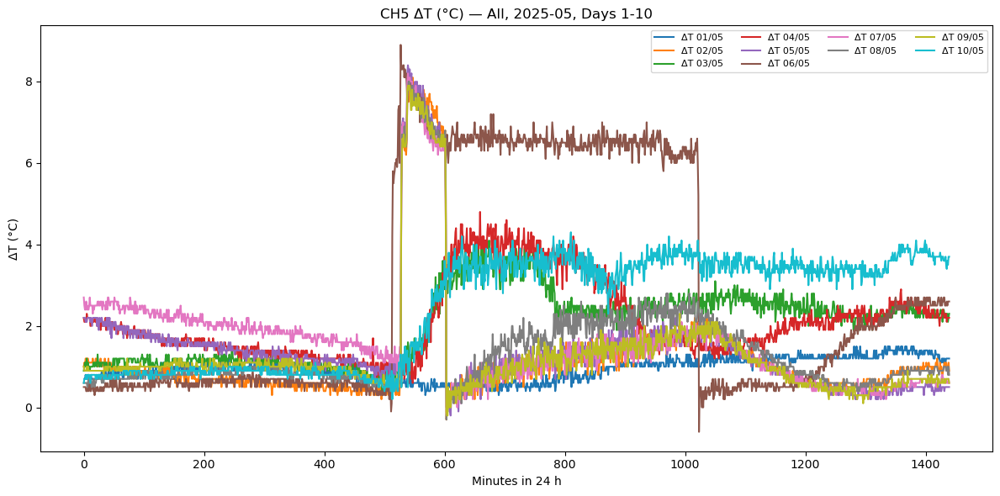

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-05_Days11-20.png


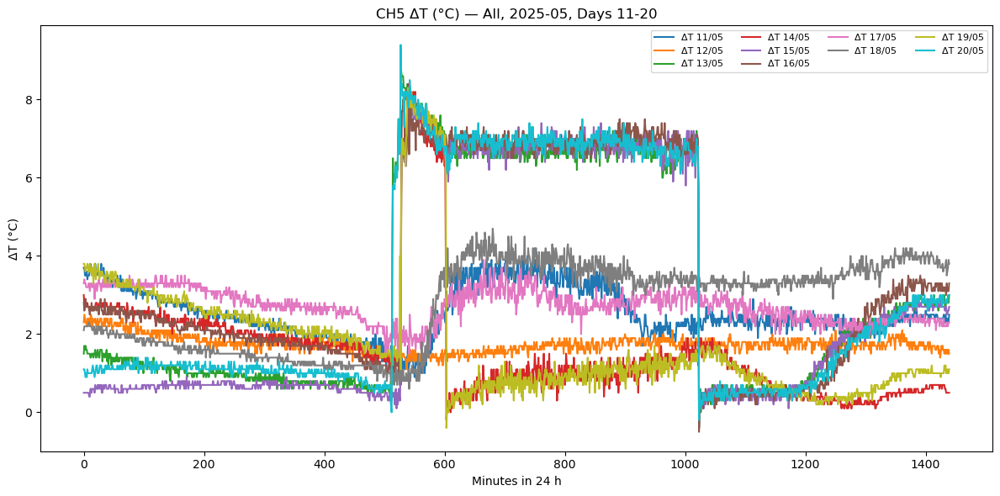

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-05_Days21-30.png


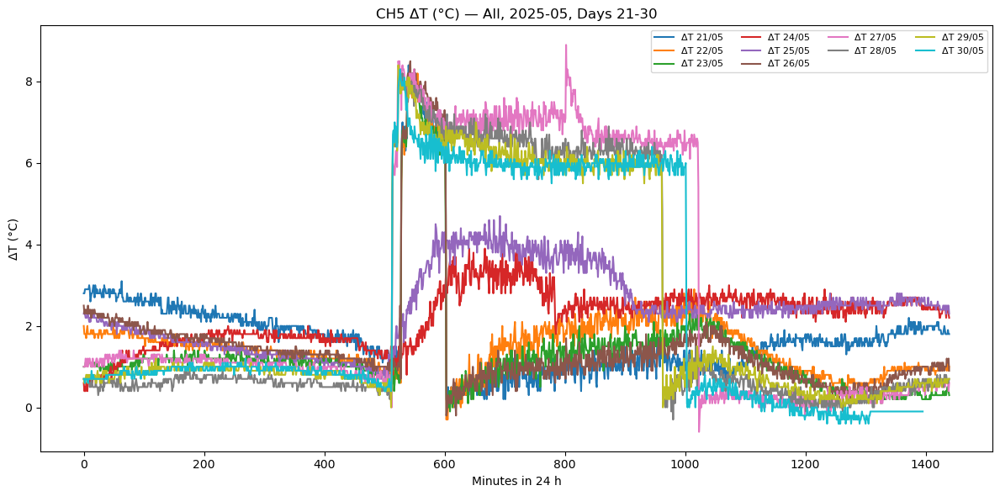


=== CH5 ΔT Summary (weekdays) 2025-05 ===
      CH5_DELTA
min       -0.60
mean       2.09
max        9.40
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekdays_2025-05.png


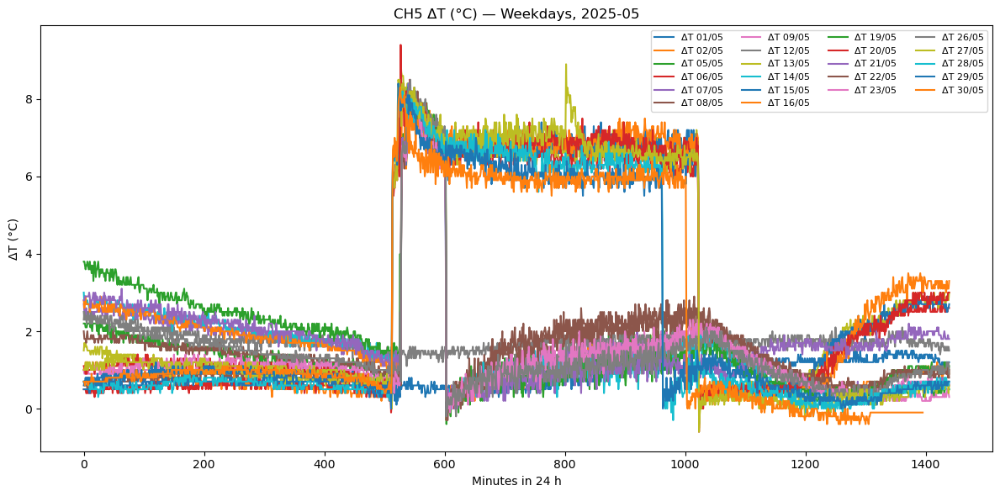


=== CH5 ΔT Summary (weekends) 2025-05 ===
      CH5_DELTA
min       -0.10
mean       2.41
max        4.80
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekends_2025-05.png


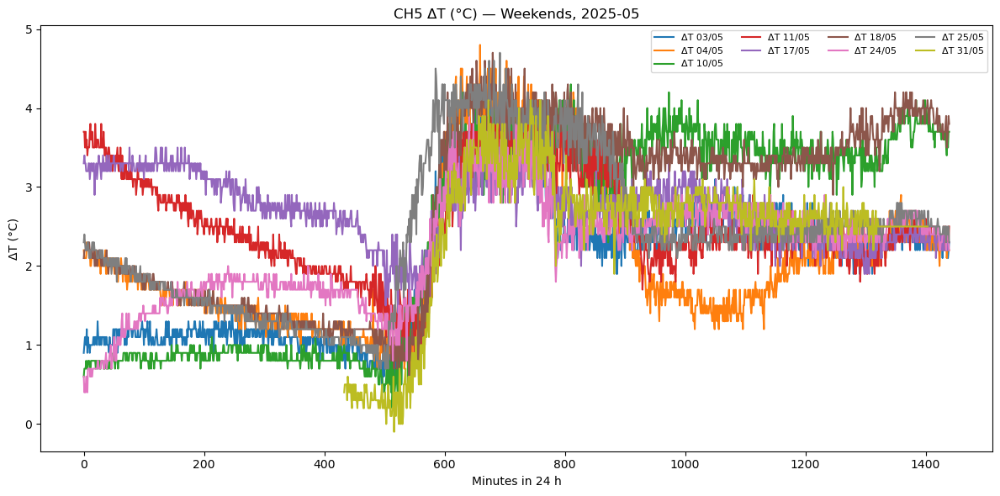


=== CH5 ΔT Summary (all) 2025-06 ===
      CH5_DELTA
min        -0.8
mean        1.8
max         8.8
 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-06_Days1-10.png


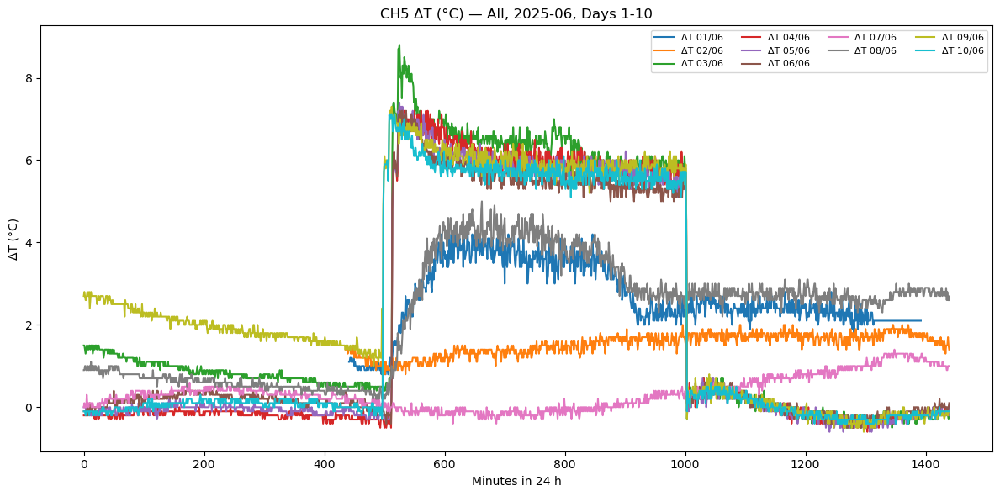

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-06_Days11-20.png


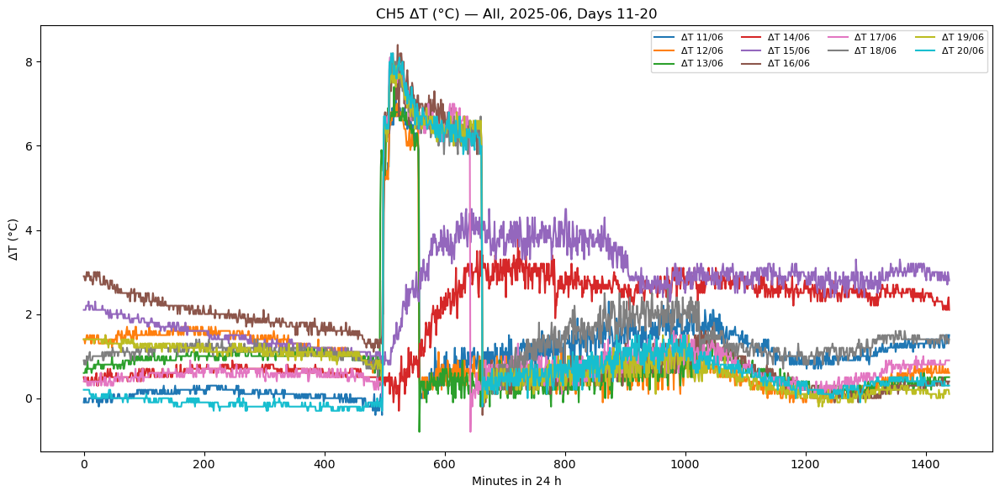

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-06_Days21-30.png


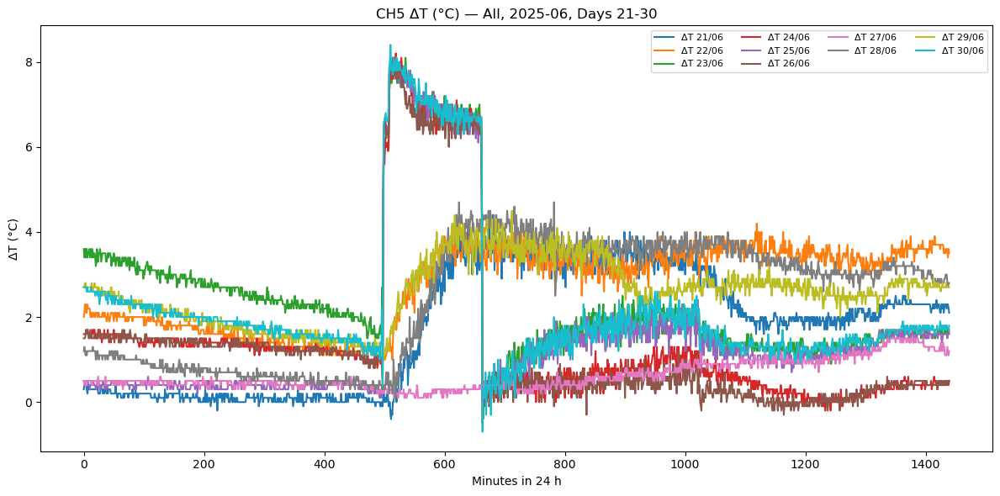


=== CH5 ΔT Summary (weekdays) 2025-06 ===
      CH5_DELTA
min       -0.80
mean       1.67
max        8.80
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekdays_2025-06.png


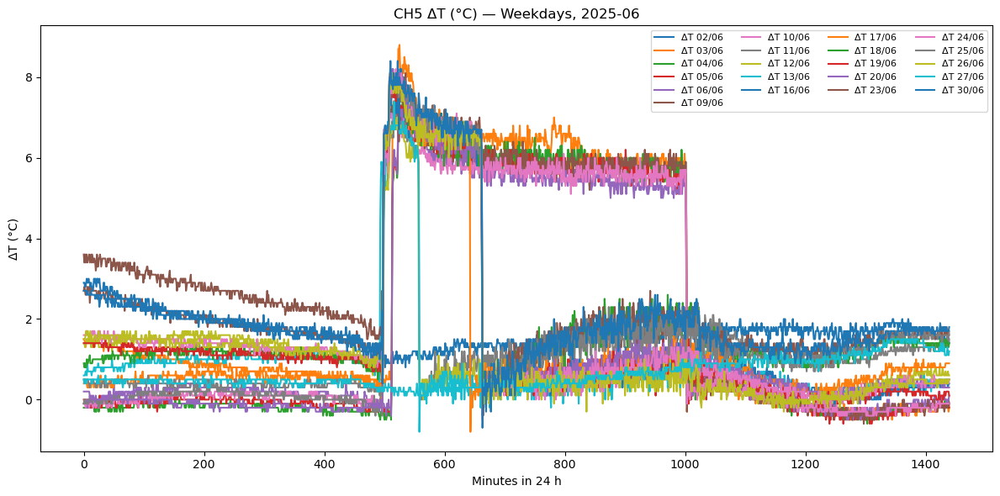


=== CH5 ΔT Summary (weekends) 2025-06 ===
      CH5_DELTA
min       -0.40
mean       2.11
max        5.00
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekends_2025-06.png


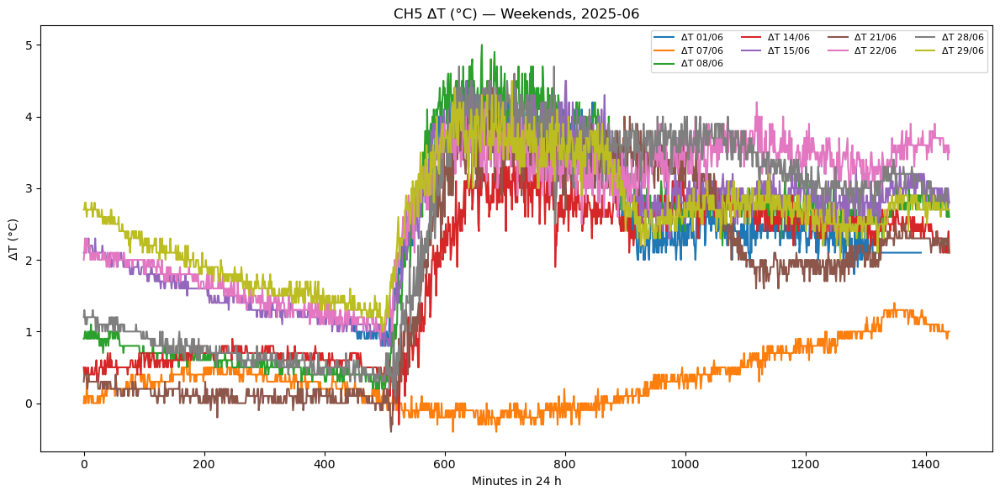


=== CH5 ΔT Summary (all) 2025-07 ===
      CH5_DELTA
min       -0.60
mean       1.82
max       11.20
 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-07_Days1-10.png


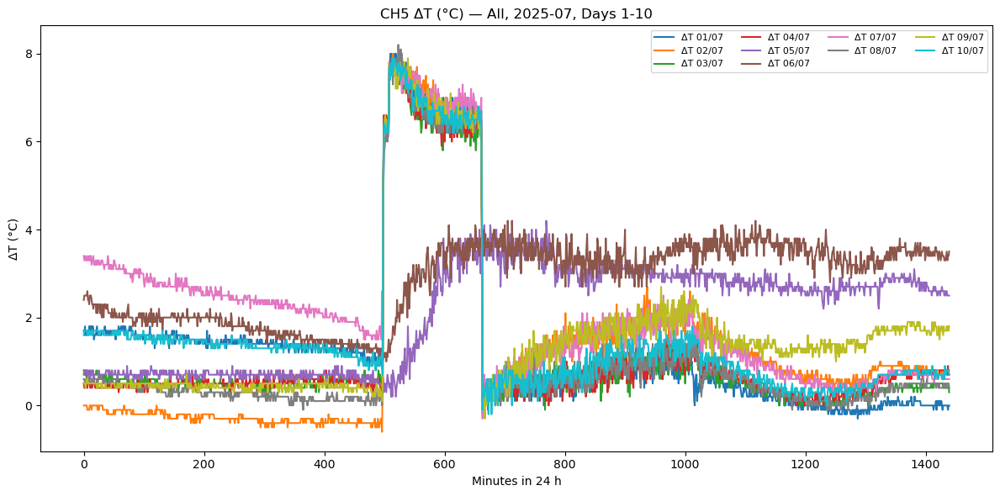

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-07_Days11-20.png


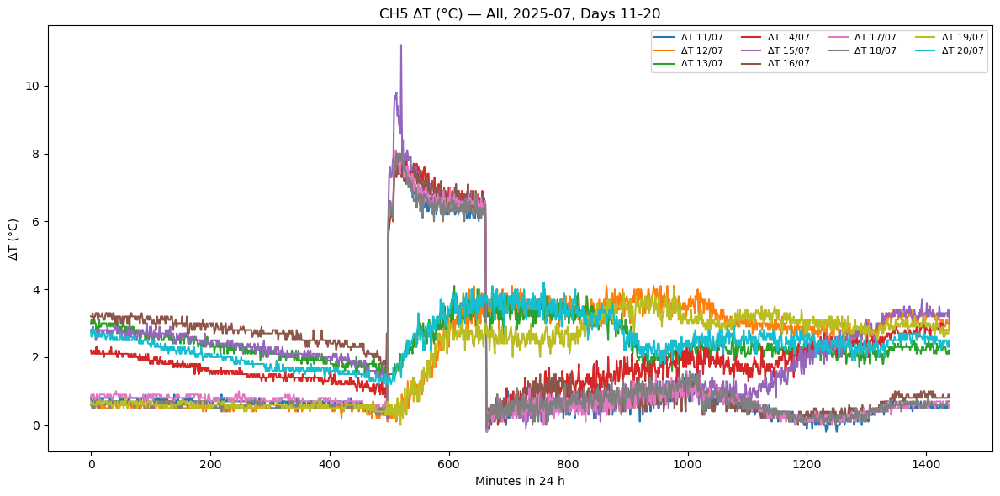

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-07_Days21-30.png


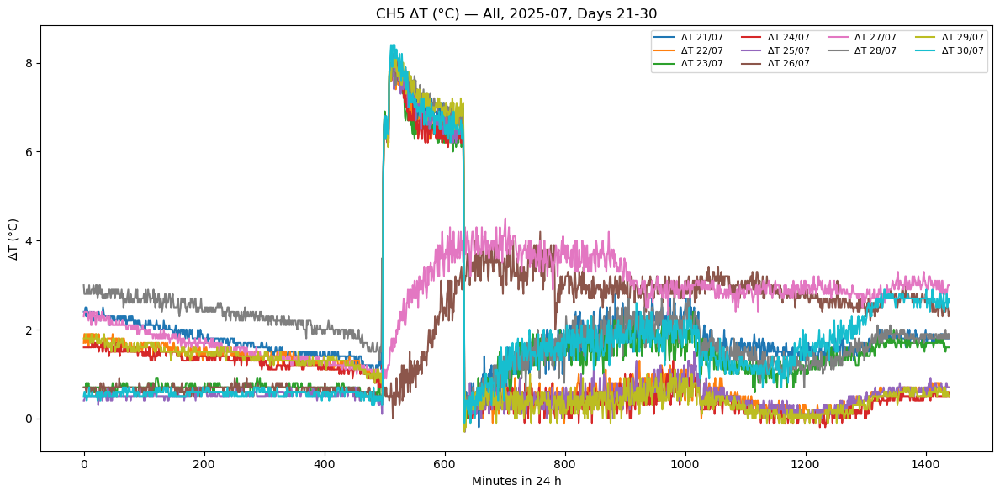


=== CH5 ΔT Summary (weekdays) 2025-07 ===
      CH5_DELTA
min       -0.60
mean       1.64
max       11.20
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekdays_2025-07.png


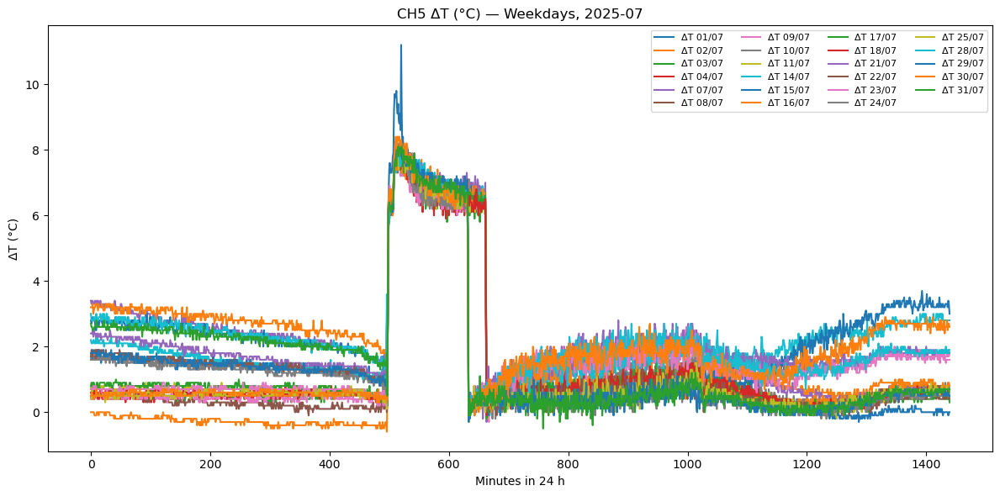


=== CH5 ΔT Summary (weekends) 2025-07 ===
      CH5_DELTA
min        0.00
mean       2.33
max        4.50
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekends_2025-07.png


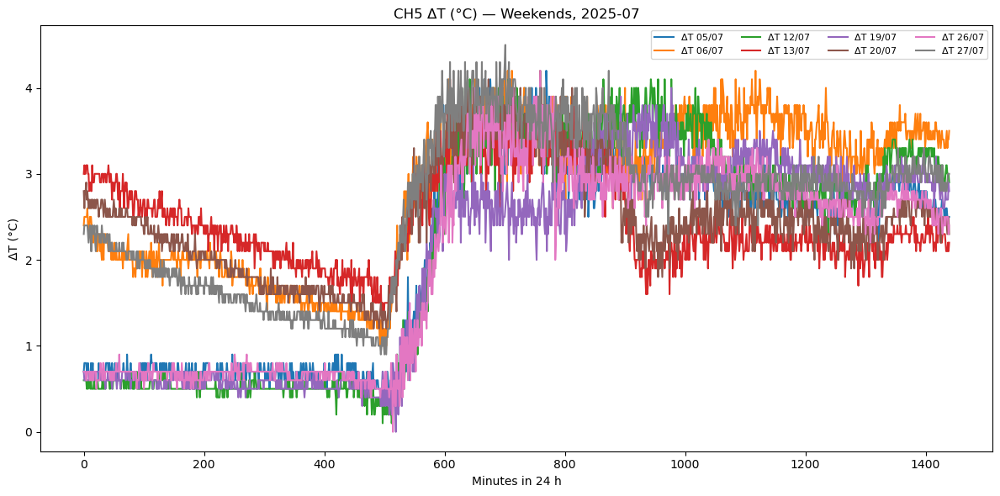


=== CH5 ΔT Summary (all) 2025-08 ===
      CH5_DELTA
min       -0.40
mean       1.82
max        9.50
 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-08_Days1-10.png


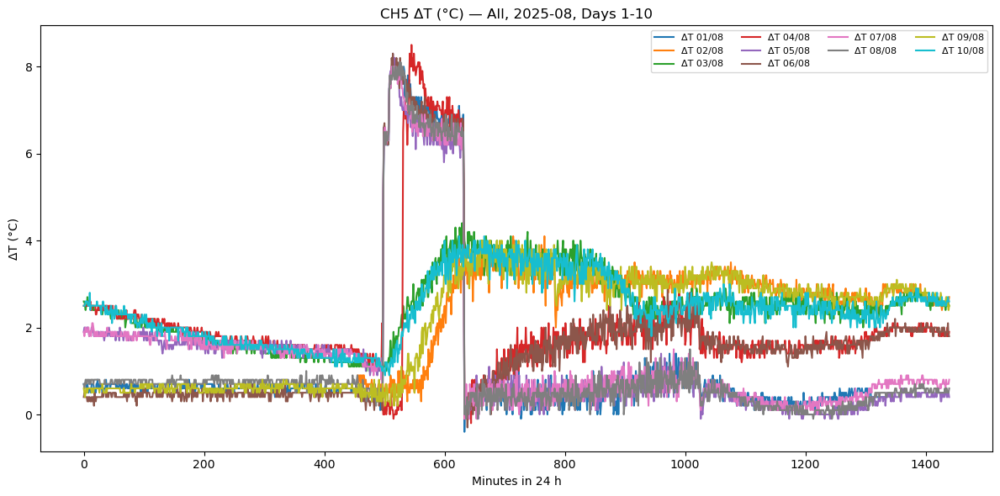

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-08_Days11-20.png


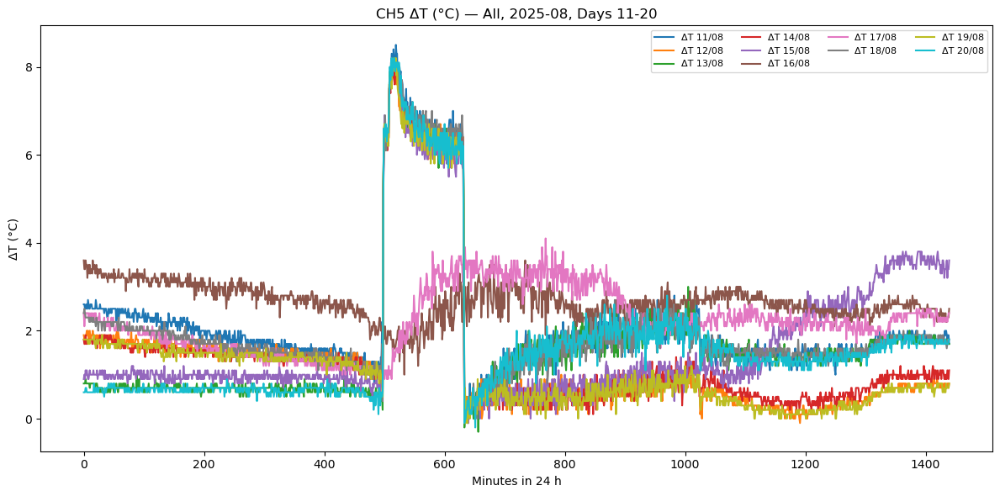

 Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_all_2025-08_Days21-30.png


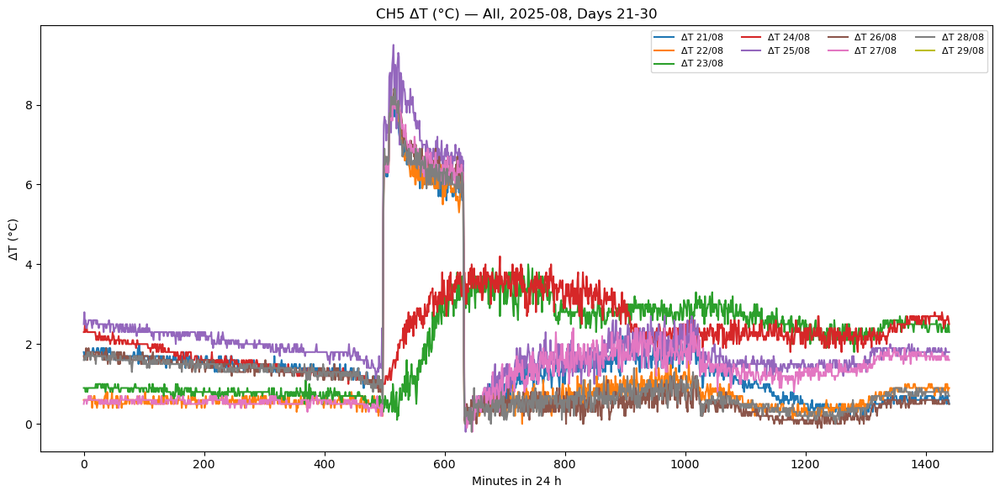


=== CH5 ΔT Summary (weekdays) 2025-08 ===
      CH5_DELTA
min       -0.40
mean       1.63
max        9.50
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekdays_2025-08.png


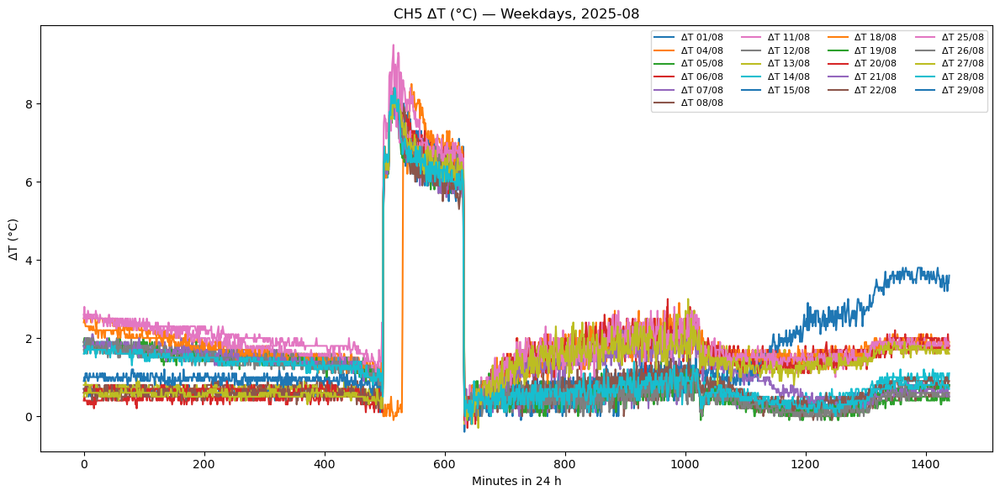


=== CH5 ΔT Summary (weekends) 2025-08 ===
      CH5_DELTA
min        0.10
mean       2.33
max        4.40
✅ Saved: C:\Users\QiYangWong\Downloads\Amcorp Pic\CH5_ΔT_weekends_2025-08.png


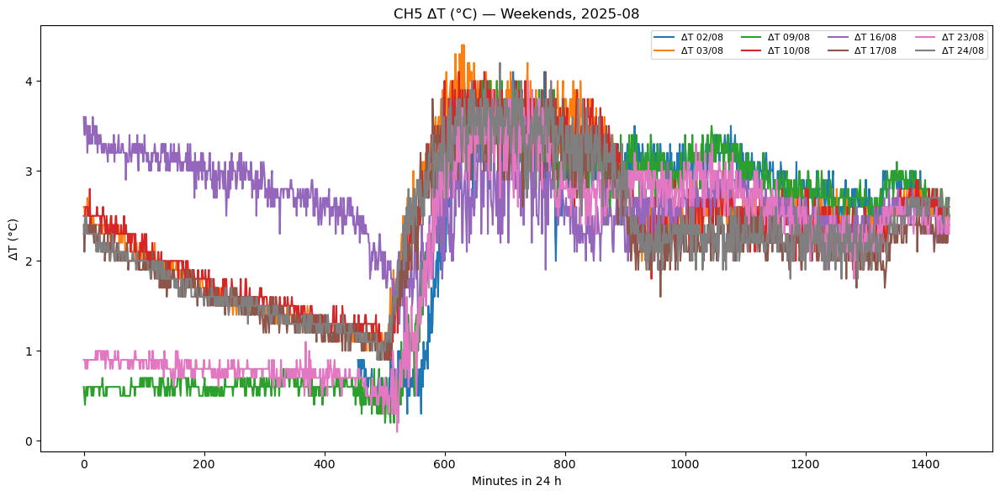

In [192]:
import os
import matplotlib.pyplot as plt
import calendar

def plot_chiller_deltaT(df, chiller=1, year=2025, month=6, mode="all",
                        save_path=None, show_in_notebook=True):

    supply_col = f"TE1CH{chiller}_ENG"
    return_col = f"TE2CH{chiller}_ENG"
    delta_col  = f"CH{chiller}_DELTA"

    if supply_col not in df.columns or return_col not in df.columns:
        print(f" Columns for CH{chiller} not found.")
        return

    df = df.copy()
    df[delta_col] = df[return_col] - df[supply_col]

    sub = df[(df.index.year == year) & (df.index.month == month)]
    if mode == "weekdays":
        sub = sub[sub.index.weekday < 5]
    elif mode == "weekends":
        sub = sub[sub.index.weekday >= 5]
    if sub.empty:
        print(f" No data for CH{chiller} ({mode}) {year}-{month:02d}")
        return

    stats = sub[[delta_col]].describe().loc[["min","mean","max"]].round(2)
    print(f"\n=== CH{chiller} ΔT Summary ({mode}) {year}-{month:02d} ===")
    print(stats)

    if mode == "all":
        _, last = calendar.monthrange(year, month)
        for start in (1, 11, 21):
            end = min(start + 9, last)
            sub_chunk = sub[(sub.index.day >= start) & (sub.index.day <= end)]
            if sub_chunk.empty:
                continue

            fig, ax = plt.subplots(figsize=(12,6))
            for d, g in sub_chunk.groupby(sub_chunk.index.date):
                ax.plot(g.index.hour*60 + g.index.minute, g[delta_col], label=f"ΔT {d:%d/%m}")

            ax.set_title(f"CH{chiller} ΔT (°C) — All, {year}-{month:02d}, Days {start}-{end}")
            ax.set_xlabel("Minutes in 24 h")
            ax.set_ylabel("ΔT (°C)")
            ax.legend(ncol=4, fontsize=8)
            fig.tight_layout()

            if save_path:
                os.makedirs(save_path, exist_ok=True)
                filename = os.path.join(save_path, f"CH{chiller}_ΔT_all_{year}-{month:02d}_Days{start}-{end}.png")
                fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
                print(f" Saved: {filename}")

            if show_in_notebook:
                plt.show()
            else:
                plt.close(fig)

    else:
        fig, ax = plt.subplots(figsize=(12,6))
        for d, g in sub.groupby(sub.index.date):
            ax.plot(g.index.hour*60 + g.index.minute, g[delta_col], label=f"ΔT {d:%d/%m}")

        ax.set_title(f"CH{chiller} ΔT (°C) — {mode.title()}, {year}-{month:02d}")
        ax.set_xlabel("Minutes in 24 h")
        ax.set_ylabel("ΔT (°C)")
        ax.legend(ncol=4, fontsize=8)
        fig.tight_layout()

        if save_path:
            os.makedirs(save_path, exist_ok=True)
            filename = os.path.join(save_path, f"CH{chiller}_ΔT_{mode}_{year}-{month:02d}.png")
            fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
            print(f"✅ Saved: {filename}")

        if show_in_notebook:
            plt.show()
        else:
            plt.close(fig)

save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"


plot_chiller_deltaT(df, chiller=5, year=2025, month=5, mode="all", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=5, mode="weekdays", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=5, mode="weekends", save_path=save_folder)

plot_chiller_deltaT(df, chiller=5, year=2025, month=6, mode="all", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=6, mode="weekdays", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=6, mode="weekends", save_path=save_folder)

plot_chiller_deltaT(df, chiller=5, year=2025, month=7, mode="all", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=7, mode="weekdays", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=7, mode="weekends", save_path=save_folder)

plot_chiller_deltaT(df, chiller=5, year=2025, month=8, mode="all", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=8, mode="weekdays", save_path=save_folder)
plot_chiller_deltaT(df, chiller=5, year=2025, month=8, mode="weekends", save_path=save_folder)

In [2]:
import os
import matplotlib.pyplot as plt
import calendar

def plot_building_supply_return(df, building="EMML", year=2025, month=6, mode="all",
                                save_path=None, show_in_notebook=True):
    supply_col = f"{building}_MOD_T1"
    return_col = f"{building}_MOD_T2"

    if supply_col not in df.columns or return_col not in df.columns:
        print(f" Columns not found for {building}.")
        return

    sub = df[(df.index.year == year) & (df.index.month == month)]
    if mode == "weekdays":
        sub = sub[sub.index.weekday < 5]
    elif mode == "weekends":
        sub = sub[sub.index.weekday >= 5]

    if sub.empty:
        print(f" No data for {building} ({mode}) {year}-{month:02d}")
        return

    stats = sub[[supply_col, return_col]].describe().loc[["min","mean","max"]].round(2)
    print(f"\n=== {building} Supply & Return Summary ({mode}) {year}-{month:02d} ===")
    print(stats)

    _, last = calendar.monthrange(year, month)
    if mode == "all":
        chunks = [(1,10), (11,20), (21,31)]
    else:
        chunks = [(1,31)]

    for (start,end) in chunks:
        sub_chunk = sub[(sub.index.day >= start) & (sub.index.day <= end)]
        if sub_chunk.empty:
            continue

        fig, ax = plt.subplots(figsize=(12,6))
        for d, g in sub_chunk.groupby(sub_chunk.index.date):
            ax.plot(g.index.hour*60 + g.index.minute, g[supply_col], label=f"Supply {d:%d/%m}")
            ax.plot(g.index.hour*60 + g.index.minute, g[return_col], linestyle="--", label=f"Return {d:%d/%m}")

        ax.set_title(f"{building} Supply & Return (°C) — {mode.title()}, {year}-{month:02d}, Days {start}-{end}")
        ax.set_xlabel("Minutes in 24 h")
        ax.set_ylabel("Temperature (°C)")
        ax.legend(ncol=4, fontsize=8)
        fig.tight_layout()

        if save_path:
            os.makedirs(save_path, exist_ok=True)
            filename = os.path.join(save_path, f"{building}_T1T2_{mode}_{year}-{month:02d}_Days{start}-{end}.png")
            fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
            print(f" Saved: {filename}")

        if show_in_notebook:
            plt.show()
        else:
            plt.close(fig)


In [3]:
def plot_building_deltaT(df, building="EMML", year=2025, month=6, mode="all",
                         save_path=None, show_in_notebook=True):
    supply_col = f"{building}_MOD_T1"
    return_col = f"{building}_MOD_T2"
    delta_col  = f"{building}_DELTA"

    if supply_col not in df.columns or return_col not in df.columns:
        print(f" Columns not found for {building}.")
        return

    df = df.copy()
    df[delta_col] = df[return_col] - df[supply_col]

    sub = df[(df.index.year == year) & (df.index.month == month)]
    if mode == "weekdays":
        sub = sub[sub.index.weekday < 5]
    elif mode == "weekends":
        sub = sub[sub.index.weekday >= 5]

    if sub.empty:
        print(f"⚠️ No data for {building} ({mode}) {year}-{month:02d}")
        return

    stats = sub[[delta_col]].describe().loc[["min","mean","max"]].round(2)
    print(f"\n=== {building} ΔT Summary ({mode}) {year}-{month:02d} ===")
    print(stats)

    if mode == "all":
        _, last = calendar.monthrange(year, month)
        chunks = [(1,10), (11,20), (21,31)]
    else:
        chunks = [(1,31)]

    for (start,end) in chunks:
        sub_chunk = sub[(sub.index.day >= start) & (sub.index.day <= end)]
        if sub_chunk.empty:
            continue

        fig, ax = plt.subplots(figsize=(12,6))
        for d, g in sub_chunk.groupby(sub_chunk.index.date):
            ax.plot(g.index.hour*60 + g.index.minute, g[delta_col], label=f"ΔT {d:%d/%m}")

        ax.set_title(f"{building} ΔT (Return − Supply, °C) — {mode.title()}, {year}-{month:02d}, Days {start}-{end}")
        ax.set_xlabel("Minutes in 24 h")
        ax.set_ylabel("ΔT (°C)")
        ax.legend(ncol=4, fontsize=8)
        fig.tight_layout()

        if save_path:
            os.makedirs(save_path, exist_ok=True)
            filename = os.path.join(save_path, f"{building}_ΔT_{mode}_{year}-{month:02d}_Days{start}-{end}.png")
            fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
            print(f" Saved: {filename}")

        if show_in_notebook:
            plt.show()
        else:
            plt.close(fig)


In [4]:
save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

for b in ["EMML", "EMBS", "EMTA", "EMTB"]:
    plot_building_supply_return(df, building=b, year=2025, month=8, mode="all", save_path=save_folder)
    plot_building_supply_return(df, building=b, year=2025, month=8, mode="weekdays", save_path=save_folder)
    plot_building_supply_return(df, building=b, year=2025, month=8, mode="weekends", save_path=save_folder)

    plot_building_deltaT(df, building=b, year=2025, month=8, mode="all", save_path=save_folder)
    plot_building_deltaT(df, building=b, year=2025, month=8, mode="weekdays", save_path=save_folder)
    plot_building_deltaT(df, building=b, year=2025, month=8, mode="weekends", save_path=save_folder)


NameError: name 'df' is not defined

In [198]:
def cooling_load_histogram(df, start_date, end_date, bins=np.arange(0, 401, 50), save_path=None, show_in_notebook=True):
  
    col_name = "TOTAL_COOLING_RT_TA_TB"
    if col_name not in df.columns:
        print(f" Column '{col_name}' not found in dataframe.")
        return

    sub = df.loc[start_date:end_date, col_name].dropna()
    if sub.empty:S
    print(f" No data available between {start_date} and {end_date}.")
    return

    counts, edges = np.histogram(sub, bins=bins)
    perc = counts / counts.sum() * 100

    fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.bar(edges[:-1], perc, width=np.diff(edges),
                  align="edge", color="coral", edgecolor="black")
    ax.set_title(f"Cooling Load Occurrence ({start_date} → {end_date})")
    ax.set_xlabel("Cooling Load (RT)")
    ax.set_ylabel("Occurrence (%)")
    ax.set_xticks(edges)
    ax.set_ylim(0, perc.max() * 1.2)

    for bar, p in zip(bars, perc):
        if p > 0:
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                    f"{p:.0f}%", ha="center", va="bottom", fontsize=9)

    fig.tight_layout()

    if save_path:
        os.makedirs(save_path, exist_ok=True)
        filename = os.path.join(
            save_path,
            f"Cooling_Load_Hist_{start_date[:7]}_{start_date[-2:]}to{end_date[-2:]}.png"
        )
        fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
        print(f" Saved histogram: {filename}")

    if show_in_notebook:
        plt.show()
    else:
        plt.close(fig)

    print("\n=== Cooling Load Histogram Stats ===")
    for i in range(len(edges)-1):
        print(f"{edges[i]:>3}–{edges[i+1]:<3} RT : {perc[i]:.1f}%")



 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-05-01_2025-05-31_gt50RT.png


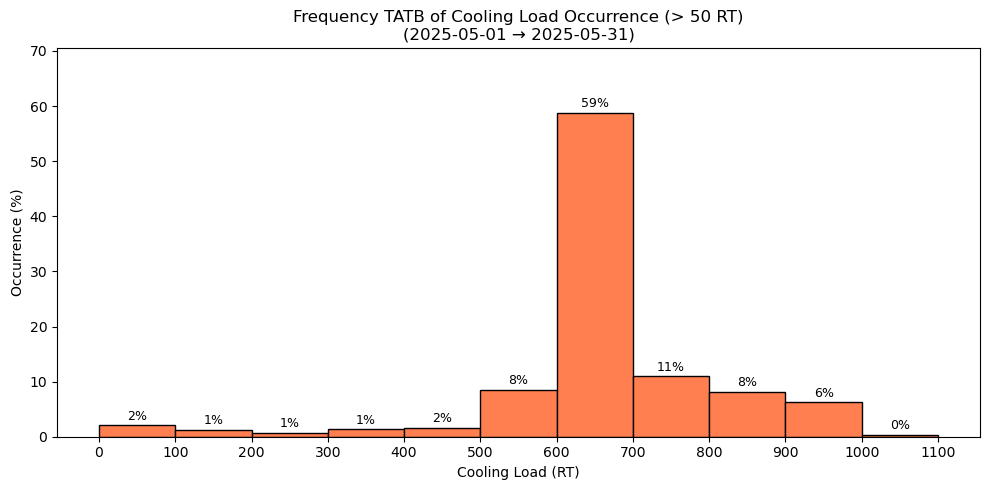


=== Cooling Load Histogram Summary (2025-05-01 → 2025-05-31, > 50 RT) ===
   0–100  RT : 2.1%
 100–200  RT : 1.3%
 200–300  RT : 0.8%
 300–400  RT : 1.3%
 400–500  RT : 1.7%
 500–600  RT : 8.4%
 600–700  RT : 58.8%
 700–800  RT : 10.9%
 800–900  RT : 8.2%
 900–1000 RT : 6.2%
1000–1100 RT : 0.3%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-06-01_2025-06-30_gt50RT.png


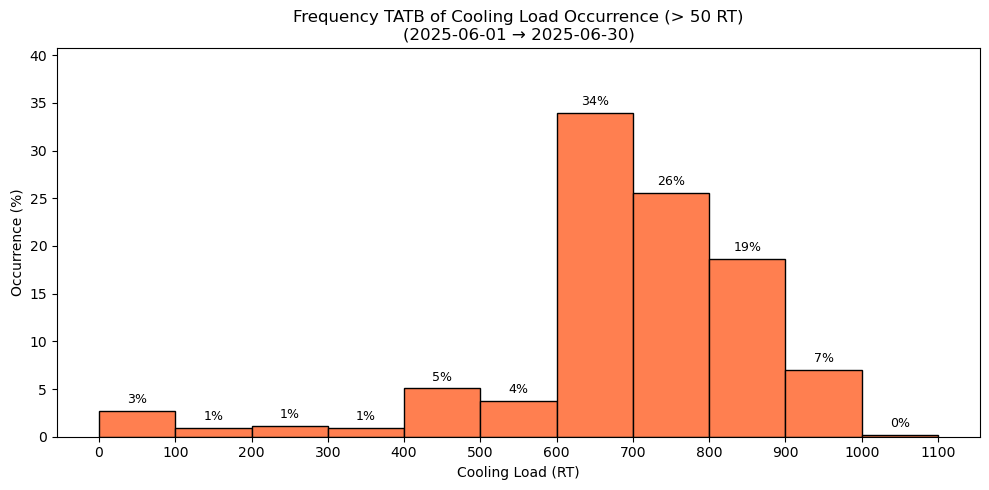


=== Cooling Load Histogram Summary (2025-06-01 → 2025-06-30, > 50 RT) ===
   0–100  RT : 2.7%
 100–200  RT : 0.9%
 200–300  RT : 1.1%
 300–400  RT : 1.0%
 400–500  RT : 5.1%
 500–600  RT : 3.7%
 600–700  RT : 34.0%
 700–800  RT : 25.6%
 800–900  RT : 18.7%
 900–1000 RT : 7.0%
1000–1100 RT : 0.2%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-07-01_2025-07-31_gt50RT.png


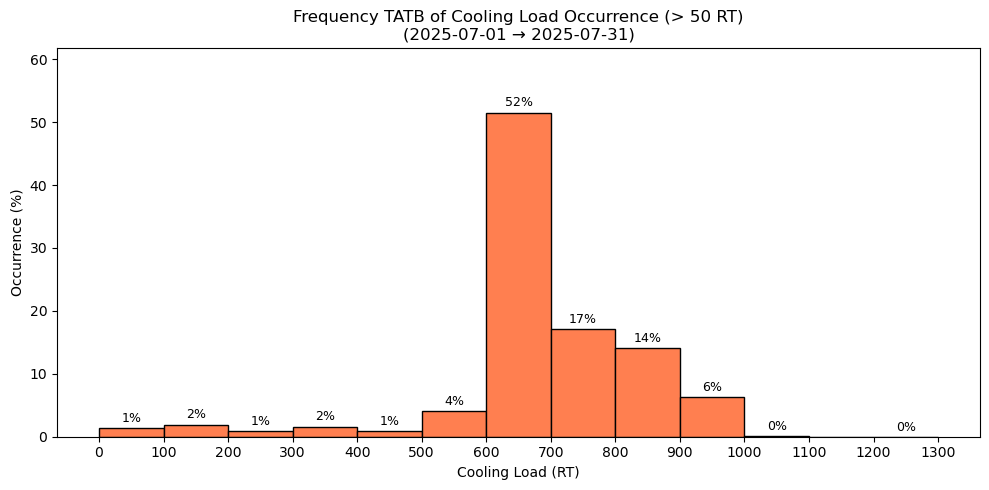


=== Cooling Load Histogram Summary (2025-07-01 → 2025-07-31, > 50 RT) ===
   0–100  RT : 1.4%
 100–200  RT : 1.9%
 200–300  RT : 0.9%
 300–400  RT : 1.6%
 400–500  RT : 0.9%
 500–600  RT : 4.0%
 600–700  RT : 51.5%
 700–800  RT : 17.1%
 800–900  RT : 14.1%
 900–1000 RT : 6.3%
1000–1100 RT : 0.2%
1100–1200 RT : 0.0%
1200–1300 RT : 0.0%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-08-01_2025-08-29_gt50RT.png


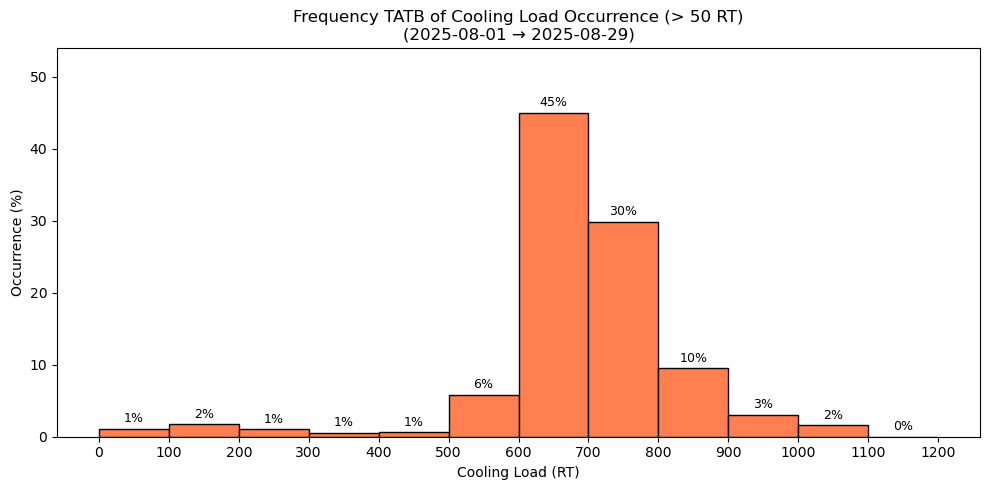


=== Cooling Load Histogram Summary (2025-08-01 → 2025-08-29, > 50 RT) ===
   0–100  RT : 1.1%
 100–200  RT : 1.7%
 200–300  RT : 1.0%
 300–400  RT : 0.6%
 400–500  RT : 0.6%
 500–600  RT : 5.8%
 600–700  RT : 45.0%
 700–800  RT : 29.9%
 800–900  RT : 9.5%
 900–1000 RT : 3.1%
1000–1100 RT : 1.6%
1100–1200 RT : 0.0%


In [204]:
save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

cooling_load_histogram(df, "2025-05-01", "2025-05-31", save_path=save_folder)
cooling_load_histogram(df, "2025-06-01", "2025-06-30", save_path=save_folder)
cooling_load_histogram(df, "2025-07-01", "2025-07-31", save_path=save_folder)
cooling_load_histogram(df, "2025-08-01", "2025-08-29", save_path=save_folder)


In [205]:
def cooling_load_histogram(df, start_date, end_date,
                           column="TOTAL_COOLING_RT_TA_TB",
                           threshold=50,
                           bin_step=100,
                           save_path=None,
                           show_in_notebook=True):
    sub = df.loc[start_date:end_date, column].dropna()
    sub = sub[sub > threshold]
    if sub.empty:
        print(f"No data above {threshold} RT between {start_date} → {end_date}.")
        return

    max_rt = np.ceil(sub.max() / bin_step) * bin_step
    bins = np.arange(0, max_rt + bin_step, bin_step)

    counts, edges = np.histogram(sub, bins=bins)
    perc = counts / counts.sum() * 100

    fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.bar(edges[:-1], perc, width=np.diff(edges), align="edge",
                  color="coral", edgecolor="black")
    ax.set_title(f"Frequency TATB of Cooling Load Occurrence (> {threshold} RT)\n({start_date} → {end_date})")
    ax.set_xlabel("Cooling Load (RT)")
    ax.set_ylabel("Occurrence (%)")
    ax.set_xticks(edges)
    ax.set_ylim(0, max(perc.max() * 1.2, 5))

    for bar, p in zip(bars, perc):
        if p > 0:
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()+0.5,
                    f"{p:.0f}%", ha="center", va="bottom", fontsize=9)

    fig.tight_layout()

    if save_path:
        os.makedirs(save_path, exist_ok=True)
        filename = os.path.join(
            save_path,
            f"CoolingLoad_TATB_Frequency_{start_date}_{end_date}_gt{threshold}RT.png"
        )
        fig.savefig(filename, dpi=300, bbox_inches="tight", facecolor="white")
        print(f" Saved successfully to: {filename}")

    if show_in_notebook:
        plt.show()
    else:
        plt.close(fig)

    print(f"\n=== Cooling Load Histogram Summary ({start_date} → {end_date}, > {threshold} RT) ===")
    for i in range(len(edges)-1):
        print(f"{edges[i]:>4.0f}–{edges[i+1]:<4.0f} RT : {perc[i]:.1f}%")


 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-05-01_2025-05-31_gt50RT.png


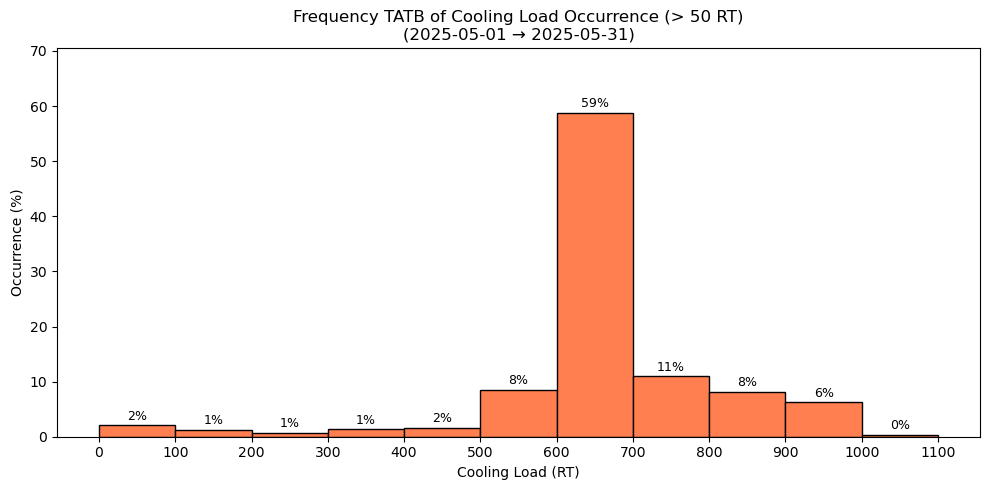


=== Cooling Load Histogram Summary (2025-05-01 → 2025-05-31, > 50 RT) ===
   0–100  RT : 2.1%
 100–200  RT : 1.3%
 200–300  RT : 0.8%
 300–400  RT : 1.3%
 400–500  RT : 1.7%
 500–600  RT : 8.4%
 600–700  RT : 58.8%
 700–800  RT : 10.9%
 800–900  RT : 8.2%
 900–1000 RT : 6.2%
1000–1100 RT : 0.3%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-06-01_2025-06-30_gt50RT.png


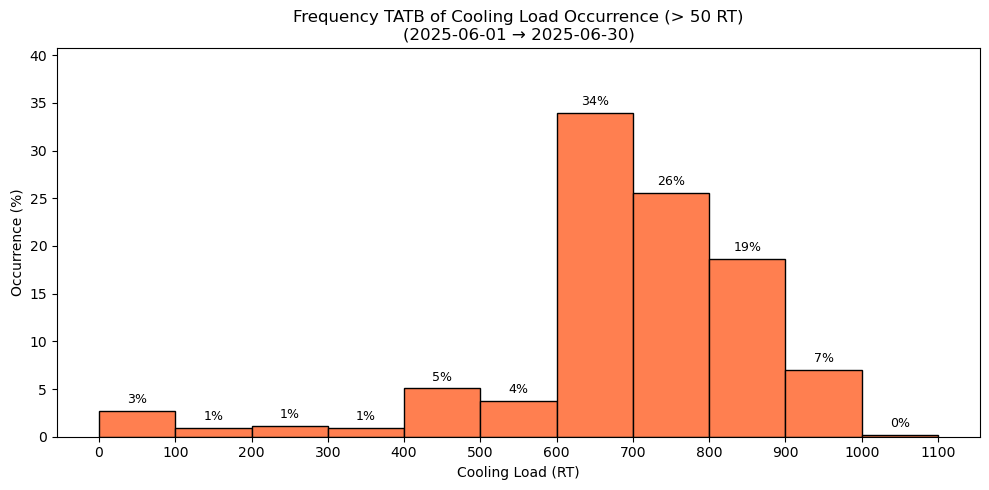


=== Cooling Load Histogram Summary (2025-06-01 → 2025-06-30, > 50 RT) ===
   0–100  RT : 2.7%
 100–200  RT : 0.9%
 200–300  RT : 1.1%
 300–400  RT : 1.0%
 400–500  RT : 5.1%
 500–600  RT : 3.7%
 600–700  RT : 34.0%
 700–800  RT : 25.6%
 800–900  RT : 18.7%
 900–1000 RT : 7.0%
1000–1100 RT : 0.2%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-07-01_2025-07-31_gt50RT.png


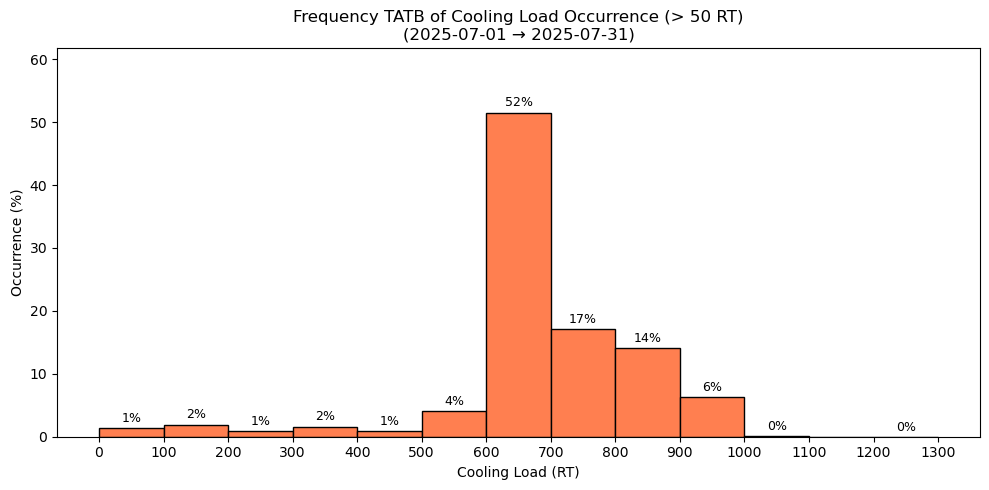


=== Cooling Load Histogram Summary (2025-07-01 → 2025-07-31, > 50 RT) ===
   0–100  RT : 1.4%
 100–200  RT : 1.9%
 200–300  RT : 0.9%
 300–400  RT : 1.6%
 400–500  RT : 0.9%
 500–600  RT : 4.0%
 600–700  RT : 51.5%
 700–800  RT : 17.1%
 800–900  RT : 14.1%
 900–1000 RT : 6.3%
1000–1100 RT : 0.2%
1100–1200 RT : 0.0%
1200–1300 RT : 0.0%
 Saved successfully to: C:\Users\QiYangWong\Downloads\Amcorp Pic\CoolingLoad_TATB_Frequency_2025-08-01_2025-08-29_gt50RT.png


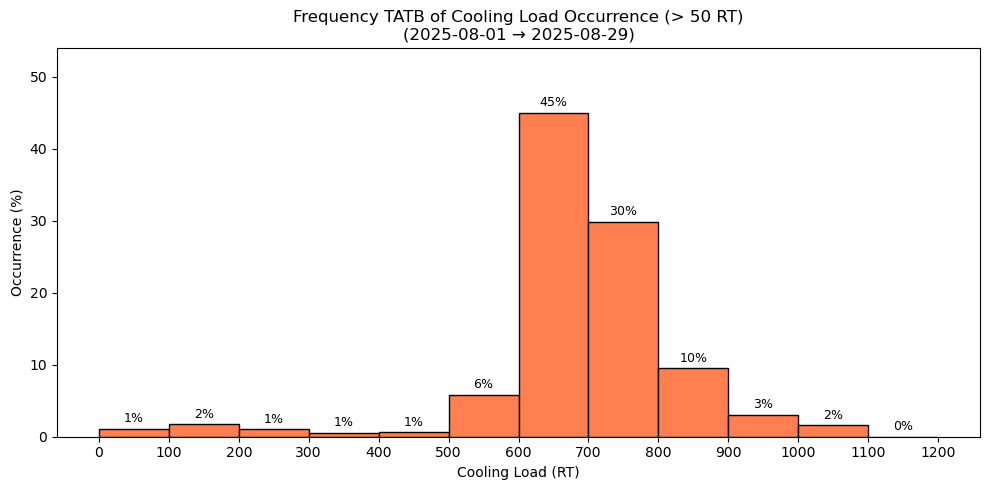


=== Cooling Load Histogram Summary (2025-08-01 → 2025-08-29, > 50 RT) ===
   0–100  RT : 1.1%
 100–200  RT : 1.7%
 200–300  RT : 1.0%
 300–400  RT : 0.6%
 400–500  RT : 0.6%
 500–600  RT : 5.8%
 600–700  RT : 45.0%
 700–800  RT : 29.9%
 800–900  RT : 9.5%
 900–1000 RT : 3.1%
1000–1100 RT : 1.6%
1100–1200 RT : 0.0%


In [206]:
save_folder = r"C:\Users\QiYangWong\Downloads\Amcorp Pic"

cooling_load_histogram(df, "2025-05-01", "2025-05-31", column="TOTAL_COOLING_RT_TA_TB", save_path=save_folder)
cooling_load_histogram(df, "2025-06-01", "2025-06-30", column="TOTAL_COOLING_RT_TA_TB", save_path=save_folder)
cooling_load_histogram(df, "2025-07-01", "2025-07-31", column="TOTAL_COOLING_RT_TA_TB", save_path=save_folder)
cooling_load_histogram(df, "2025-08-01", "2025-08-29", column="TOTAL_COOLING_RT_TA_TB", save_path=save_folder)


In [207]:
def tenant_energy_allocation(df, start_date, end_date):
    tenant_cols = ["EMML_MOD_E","EMBS_MOD_E","EMTA_MOD_E","EMTB_MOD_E"]
    sub = df.loc[start_date:end_date, tenant_cols]
    daily = sub.resample("D").last().diff()
    daily.plot(kind="bar", stacked=True, figsize=(12,5))
    plt.title(f"Sub Energy Allocation {start_date} → {end_date}")
    plt.ylabel("kWh"); plt.tight_layout(); plt.show()



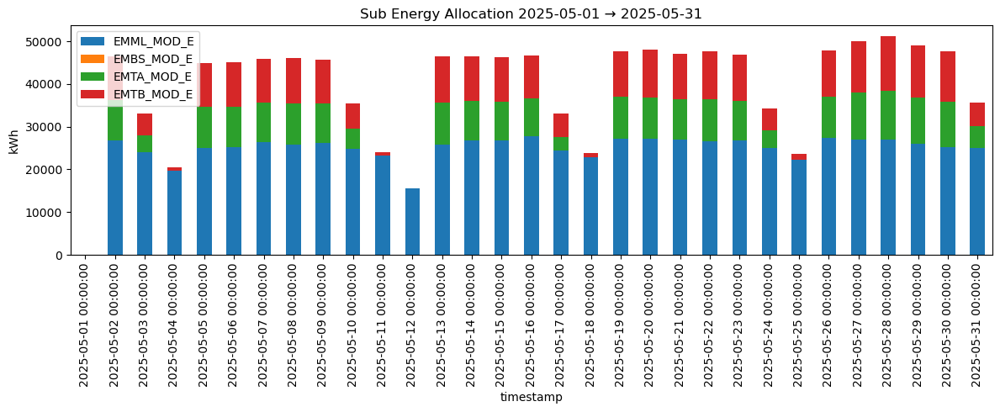

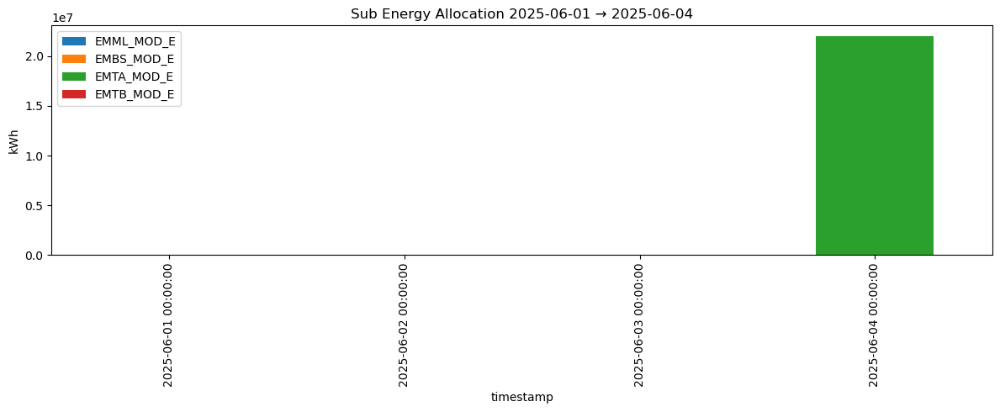

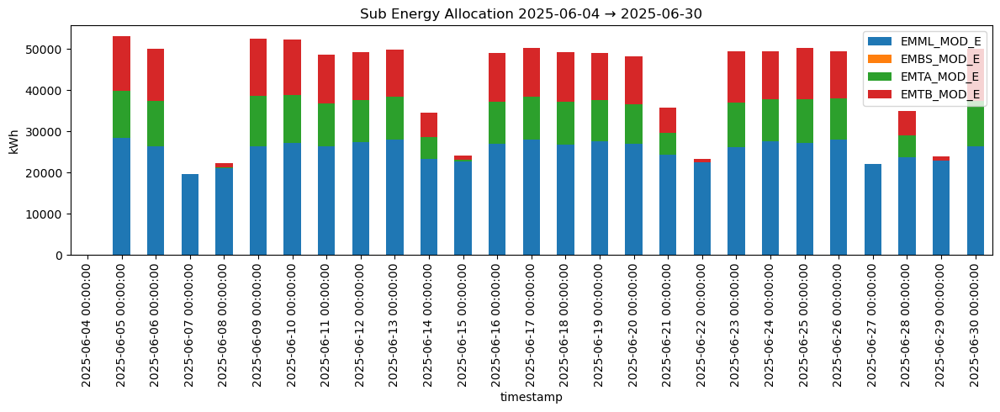

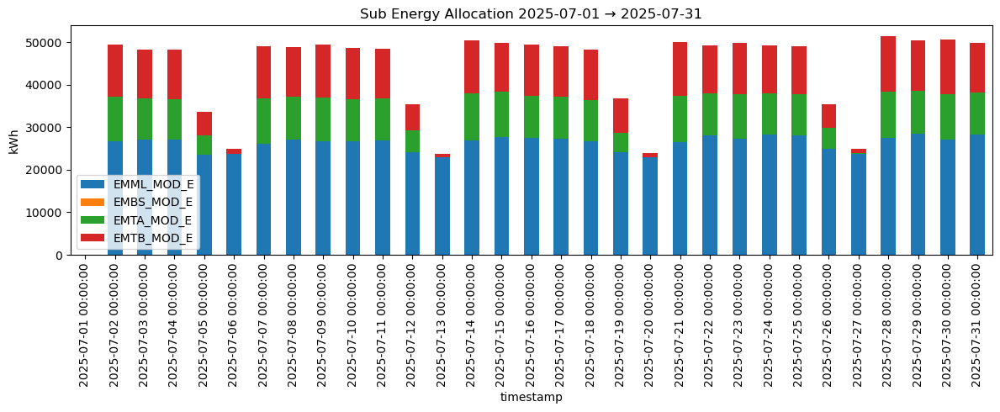

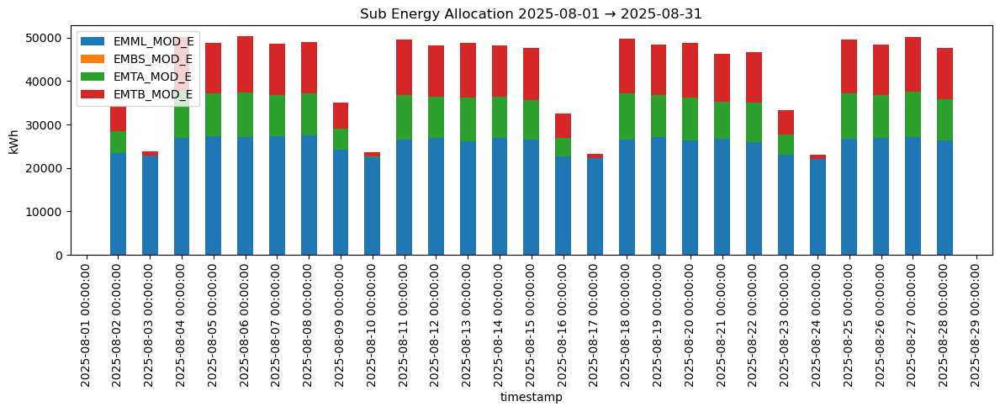

In [208]:
tenant_energy_allocation(df, "2025-05-01", "2025-05-31")
tenant_energy_allocation(df, "2025-06-01", "2025-06-04")
tenant_energy_allocation(df, "2025-06-04", "2025-06-30")

tenant_energy_allocation(df, "2025-07-01", "2025-07-31")
tenant_energy_allocation(df, "2025-08-01", "2025-08-31")
